<a href="https://colab.research.google.com/github/jessica30229/ML2023/blob/main/ml2023spring_hw1_samplecode.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Homework 1: COVID-19 Cases Prediction (Regression)**

Objectives:
* Solve a regression problem with deep neural networks (DNN).
* Understand basic DNN training tips.
* Familiarize yourself with PyTorch.

If you have any questions, please contact the TAs via TA hours, NTU COOL, or email to mlta-2023-spring@googlegroups.com

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


# Download data
If the Google Drive links below do not work, you can use the dropbox link below or download data from [Kaggle](https://www.kaggle.com/t/a339b77fa5214978bfb8dde62d3151fe), and upload data manually to the workspace.

In [ ]:
# google drive link
# !pip install gdown
# !gdown --id '1BjXalPZxq9mybPKNjF3h5L3NcF7XKTS-' --output covid_train.csv
# !gdown --id '1B55t74Jg2E5FCsKCsUEkPKIuqaY7UIi1' --output covid_test.csv

# dropbox link
!wget -O covid_train.csv https://www.dropbox.com/s/lmy1riadzoy0ahw/covid.train.csv?dl=0
!wget -O covid_test.csv https://www.dropbox.com/s/zalbw42lu4nmhr2/covid.test.csv?dl=0

--2024-01-19 08:23:48--  https://www.dropbox.com/s/lmy1riadzoy0ahw/covid.train.csv?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:6031:18::a27d:5112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/lmy1riadzoy0ahw/covid.train.csv [following]
--2024-01-19 08:23:48--  https://www.dropbox.com/s/raw/lmy1riadzoy0ahw/covid.train.csv
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc6be3c9443b1762dff32af47b8c.dl.dropboxusercontent.com/cd/0/inline/CLpeQq7NT_J1oXXg3Q5IG667REXRuzjf_vFx_kOiwHd8rbicQsi8_D8CTYJi6Xb3hDbBEX2FCCt-5W_RZRkdCI7N_QIyg2w9rVD_eTPkz9X4GZ9OMT7ou6BNZ8bI69gaKu-_lHFjE-ICN-Gg6LtxSdU1/file# [following]
--2024-01-19 08:23:48--  https://uc6be3c9443b1762dff32af47b8c.dl.dropboxusercontent.com/cd/0/inline/CLpeQq7NT_J1oXXg3Q5IG667REXRuzjf_vFx_kOiwHd8rbicQsi8_D8CTYJi6Xb3hDbBEX2FCCt-5W_RZRkdCI7

# Import packages

In [ ]:
# Numerical Operations
import math
import numpy as np

# Reading/Writing Data
import pandas as pd
import os
import csv

# For Progress Bar
from tqdm import tqdm

# Pytorch
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split

# For plotting learning curve
from torch.utils.tensorboard import SummaryWriter

# Some Utility Functions

You do not need to modify this part.

In [ ]:
def same_seed(seed):
    '''Fixes random number generator seeds for reproducibility.'''
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

def train_valid_split(data_set, valid_ratio, seed):
    '''Split provided training data into training set and validation set'''
    valid_set_size = int(valid_ratio * len(data_set))
    train_set_size = len(data_set) - valid_set_size
    train_set, valid_set = random_split(data_set, [train_set_size, valid_set_size], generator=torch.Generator().manual_seed(seed))
    return np.array(train_set), np.array(valid_set)

def predict(test_loader, model, device):
    model.eval() # Set your model to evaluation mode.
    preds = []
    for x in tqdm(test_loader):
        x = x.to(device)
        with torch.no_grad():
            pred = model(x)
            preds.append(pred.detach().cpu())
    preds = torch.cat(preds, dim=0).numpy()
    return preds

# Dataset

In [ ]:
class COVID19Dataset(Dataset):
    '''
    x: Features.
    y: Targets, if none, do prediction.
    '''
    def __init__(self, x, y=None):
        if y is None:
            self.y = y
        else:
            self.y = torch.FloatTensor(y)
        self.x = torch.FloatTensor(x)

    def __getitem__(self, idx):
        if self.y is None:
            return self.x[idx]
        else:
            return self.x[idx], self.y[idx]

    def __len__(self):
        return len(self.x)

# Neural Network Model
Try out different model architectures by modifying the class below.

In [ ]:
class My_Model(nn.Module):
    def __init__(self, input_dim):
        super(My_Model, self).__init__()
        # TODO: modify model's structure, be aware of dimensions.
        self.layers = nn.Sequential(
            nn.Linear(input_dim, 18),
            nn.ReLU(),
            nn.Linear(18, 9),
            nn.ReLU(),
            nn.Linear(9, 1)
        )

    def forward(self, x):
        x = self.layers(x)
        x = x.squeeze(1) # (B, 1) -> (B)
        return x

# Feature Selection
Choose features you deem useful by modifying the function below.

In [ ]:
def select_feat(train_data, valid_data, test_data, select_all=True):
    '''Selects useful features to perform regression'''
    y_train, y_valid = train_data[:,-1], valid_data[:,-1]
    raw_x_train, raw_x_valid, raw_x_test = train_data[:,:-1], valid_data[:,:-1], test_data

    if select_all:
        feat_idx = list(range(raw_x_train.shape[1]))
    else:
        feat_idx = [35, 36, 37, 47, 48, 52, 53, 54, 65, 66, 70, 71, 72, 73, 83, 84] # TODO: Select suitable feature columns.

    return raw_x_train[:,feat_idx], raw_x_valid[:,feat_idx], raw_x_test[:,feat_idx], y_train, y_valid

# Training Loop

In [ ]:
def trainer(train_loader, valid_loader, model, config, device):

    criterion = nn.MSELoss(reduction='mean') # Define your loss function, do not modify this.

    # Define your optimization algorithm.
    # TODO: Please check https://pytorch.org/docs/stable/optim.html to get more available algorithms.
    # TODO: L2 regularization (optimizer(weight decay...) or implement by your self).
    # optimizer = torch.optim.SGD(model.parameters(), lr=config['learning_rate'], momentum=0.7)
    optimizer = torch.optim.Adam(model.parameters(), lr=config['learning_rate'])
    writer = SummaryWriter() # Writer of tensoboard.

    if not os.path.isdir('./models'):
        os.mkdir('./models') # Create directory of saving models.

    n_epochs, best_loss, step, early_stop_count = config['n_epochs'], math.inf, 0, 0

    for epoch in range(n_epochs):
        model.train() # Set your model to train mode.
        loss_record = []

        # tqdm is a package to visualize your training progress.
        train_pbar = tqdm(train_loader, position=0, leave=True)

        for x, y in train_pbar:
            optimizer.zero_grad()               # Set gradient to zero.
            x, y = x.to(device), y.to(device)   # Move your data to device.
            pred = model(x)
            loss = criterion(pred, y)
            loss.backward()                     # Compute gradient(backpropagation).
            optimizer.step()                    # Update parameters.
            step += 1
            loss_record.append(loss.detach().item())

            # Display current epoch number and loss on tqdm progress bar.
            train_pbar.set_description(f'Epoch [{epoch+1}/{n_epochs}]')
            train_pbar.set_postfix({'loss': loss.detach().item()})

        mean_train_loss = sum(loss_record)/len(loss_record)
        writer.add_scalar('Loss/train', mean_train_loss, step)

        model.eval() # Set your model to evaluation mode.
        loss_record = []
        for x, y in valid_loader:
            x, y = x.to(device), y.to(device)
            with torch.no_grad():
                pred = model(x)
                loss = criterion(pred, y)

            loss_record.append(loss.item())

        mean_valid_loss = sum(loss_record)/len(loss_record)
        print(f'Epoch [{epoch+1}/{n_epochs}]: Train loss: {mean_train_loss:.4f}, Valid loss: {mean_valid_loss:.4f}')
        writer.add_scalar('Loss/valid', mean_valid_loss, step)

        if mean_valid_loss < best_loss:
            best_loss = mean_valid_loss
            torch.save(model.state_dict(), config['save_path']) # Save your best model
            print('Saving model with loss {:.3f}...'.format(best_loss))
            early_stop_count = 0
        else:
            early_stop_count += 1

        if early_stop_count >= config['early_stop']:
            print('\nModel is not improving, so we halt the training session.')
            return

# Configurations
`config` contains hyper-parameters for training and the path to save your model.

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
config = {
    'seed': 1314,      # Your seed number, you can pick your lucky number. :)
    'select_all': False,   # Whether to use all features.
    'valid_ratio': 0.2,   # validation_size = train_size * valid_ratio
    'n_epochs': 1000,     # Number of epochs. 0-100
    'batch_size': 128,
    'learning_rate': 1e-3,
    'early_stop': 600,    # If model has not improved for this many consecutive epochs, stop training.
    'save_path': './models/model.ckpt'  # Your model will be saved here.
}

# Dataloader
Read data from files and set up training, validation, and testing sets. You do not need to modify this part.

In [ ]:
# Set seed for reproducibility
same_seed(config['seed'])


# train_data size: 3009 x 89 (35 states + 18 features x 3 days)
# test_data size: 997 x 88 (without last day's positive rate)
train_data, test_data = pd.read_csv('./covid_train.csv').values, pd.read_csv('./covid_test.csv').values
train_data, valid_data = train_valid_split(train_data, config['valid_ratio'], config['seed'])

# Print out the data size.
print(f"""train_data size: {train_data.shape}
valid_data size: {valid_data.shape}
test_data size: {test_data.shape}""")

# Select features
x_train, x_valid, x_test, y_train, y_valid = select_feat(train_data, valid_data, test_data, config['select_all'])

# Print out the number of features.
print(f'number of features: {x_train.shape[1]}')

train_dataset, valid_dataset, test_dataset = COVID19Dataset(x_train, y_train), \
                                            COVID19Dataset(x_valid, y_valid), \
                                            COVID19Dataset(x_test)

# Pytorch data loader loads pytorch dataset into batches.
train_loader = DataLoader(train_dataset, batch_size=config['batch_size'], shuffle=True, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=config['batch_size'], shuffle=True, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=config['batch_size'], shuffle=False, pin_memory=True)

train_data size: (2408, 89) 
valid_data size: (601, 89) 
test_data size: (997, 88)
number of features: 16


In [ ]:
t_data = pd.read_csv('./covid_train.csv')

In [ ]:
t_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3009 entries, 0 to 3008
Data columns (total 89 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              3009 non-null   int64  
 1   AL                              3009 non-null   float64
 2   AZ                              3009 non-null   float64
 3   CA                              3009 non-null   float64
 4   CO                              3009 non-null   float64
 5   CT                              3009 non-null   float64
 6   FL                              3009 non-null   float64
 7   GA                              3009 non-null   float64
 8   IL                              3009 non-null   float64
 9   IN                              3009 non-null   float64
 10  IA                              3009 non-null   float64
 11  KS                              3009 non-null   float64
 12  KY                              30

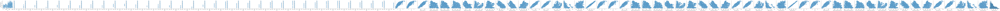

In [ ]:
import seaborn as sns
sns.pairplot(t_data,
    y_vars=["tested_positive.2"],)

# Start training!

In [ ]:
model = My_Model(input_dim=x_train.shape[1]).to(device) # put your model and data on the same computation device.
trainer(train_loader, valid_loader, model, config, device)

Epoch [1/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.46it/s, loss=350]


Epoch [1/1000]: Train loss: 408.2722, Valid loss: 327.3381
Saving model with loss 327.338...


Epoch [2/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.92it/s, loss=185]


Epoch [2/1000]: Train loss: 271.0743, Valid loss: 202.2801
Saving model with loss 202.280...


Epoch [3/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.16it/s, loss=129]


Epoch [3/1000]: Train loss: 149.8133, Valid loss: 93.6937
Saving model with loss 93.694...


Epoch [4/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.54it/s, loss=51.1]


Epoch [4/1000]: Train loss: 65.9119, Valid loss: 54.1538
Saving model with loss 54.154...


Epoch [5/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.41it/s, loss=51.3]


Epoch [5/1000]: Train loss: 50.8702, Valid loss: 52.0062
Saving model with loss 52.006...


Epoch [6/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.92it/s, loss=49]


Epoch [6/1000]: Train loss: 47.5677, Valid loss: 48.2363
Saving model with loss 48.236...


Epoch [7/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.15it/s, loss=41]


Epoch [7/1000]: Train loss: 44.1251, Valid loss: 44.5397
Saving model with loss 44.540...


Epoch [8/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.74it/s, loss=38.1]


Epoch [8/1000]: Train loss: 40.8243, Valid loss: 40.8660
Saving model with loss 40.866...


Epoch [9/1000]: 100%|██████████| 19/19 [00:00<00:00, 119.32it/s, loss=35.2]


Epoch [9/1000]: Train loss: 37.3321, Valid loss: 37.8424
Saving model with loss 37.842...


Epoch [10/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.99it/s, loss=27.1]


Epoch [10/1000]: Train loss: 33.5963, Valid loss: 33.7827
Saving model with loss 33.783...


Epoch [11/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.62it/s, loss=21.5]


Epoch [11/1000]: Train loss: 29.9822, Valid loss: 29.6830
Saving model with loss 29.683...


Epoch [12/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.69it/s, loss=28.1]


Epoch [12/1000]: Train loss: 26.2542, Valid loss: 25.7374
Saving model with loss 25.737...


Epoch [13/1000]: 100%|██████████| 19/19 [00:00<00:00, 87.70it/s, loss=20.5]


Epoch [13/1000]: Train loss: 22.5289, Valid loss: 21.7980
Saving model with loss 21.798...


Epoch [14/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.48it/s, loss=19.5]


Epoch [14/1000]: Train loss: 19.0314, Valid loss: 18.1318
Saving model with loss 18.132...


Epoch [15/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.73it/s, loss=11.4]


Epoch [15/1000]: Train loss: 15.7307, Valid loss: 15.0009
Saving model with loss 15.001...


Epoch [16/1000]: 100%|██████████| 19/19 [00:00<00:00, 118.77it/s, loss=11.1]


Epoch [16/1000]: Train loss: 13.0379, Valid loss: 12.3075
Saving model with loss 12.308...


Epoch [17/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.70it/s, loss=9.89]


Epoch [17/1000]: Train loss: 10.7780, Valid loss: 10.0823
Saving model with loss 10.082...


Epoch [18/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.84it/s, loss=7.3]


Epoch [18/1000]: Train loss: 8.7707, Valid loss: 7.9839
Saving model with loss 7.984...


Epoch [19/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.08it/s, loss=6.28]


Epoch [19/1000]: Train loss: 7.0651, Valid loss: 6.3839
Saving model with loss 6.384...


Epoch [20/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.91it/s, loss=5.12]


Epoch [20/1000]: Train loss: 5.7859, Valid loss: 5.2549
Saving model with loss 5.255...


Epoch [21/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.95it/s, loss=5.29]


Epoch [21/1000]: Train loss: 4.9409, Valid loss: 4.6093
Saving model with loss 4.609...


Epoch [22/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.78it/s, loss=4.59]


Epoch [22/1000]: Train loss: 4.3687, Valid loss: 4.0358
Saving model with loss 4.036...


Epoch [23/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.57it/s, loss=4.1]


Epoch [23/1000]: Train loss: 3.9943, Valid loss: 3.7844
Saving model with loss 3.784...


Epoch [24/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.88it/s, loss=2.87]


Epoch [24/1000]: Train loss: 3.7122, Valid loss: 3.5933
Saving model with loss 3.593...


Epoch [25/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.79it/s, loss=3.21]


Epoch [25/1000]: Train loss: 3.4742, Valid loss: 3.2710
Saving model with loss 3.271...


Epoch [26/1000]: 100%|██████████| 19/19 [00:00<00:00, 118.17it/s, loss=2.88]


Epoch [26/1000]: Train loss: 3.2469, Valid loss: 3.0494
Saving model with loss 3.049...


Epoch [27/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.51it/s, loss=2.82]


Epoch [27/1000]: Train loss: 3.0297, Valid loss: 2.8516
Saving model with loss 2.852...


Epoch [28/1000]: 100%|██████████| 19/19 [00:00<00:00, 119.90it/s, loss=2.62]


Epoch [28/1000]: Train loss: 2.8104, Valid loss: 2.6874
Saving model with loss 2.687...


Epoch [29/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.15it/s, loss=2.89]


Epoch [29/1000]: Train loss: 2.6141, Valid loss: 2.4362
Saving model with loss 2.436...


Epoch [30/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.64it/s, loss=2.36]


Epoch [30/1000]: Train loss: 2.4294, Valid loss: 2.2331
Saving model with loss 2.233...


Epoch [31/1000]: 100%|██████████| 19/19 [00:00<00:00, 119.60it/s, loss=2.51]


Epoch [31/1000]: Train loss: 2.2697, Valid loss: 2.0803
Saving model with loss 2.080...


Epoch [32/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.34it/s, loss=1.79]


Epoch [32/1000]: Train loss: 2.1210, Valid loss: 1.9090
Saving model with loss 1.909...


Epoch [33/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.28it/s, loss=2.21] 


Epoch [33/1000]: Train loss: 1.9825, Valid loss: 1.8770
Saving model with loss 1.877...


Epoch [34/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.80it/s, loss=1.41] 


Epoch [34/1000]: Train loss: 1.8478, Valid loss: 1.7009
Saving model with loss 1.701...


Epoch [35/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.77it/s, loss=1.51]


Epoch [35/1000]: Train loss: 1.7509, Valid loss: 1.5851
Saving model with loss 1.585...


Epoch [36/1000]: 100%|██████████| 19/19 [00:00<00:00, 119.20it/s, loss=1.71]


Epoch [36/1000]: Train loss: 1.6654, Valid loss: 1.5333
Saving model with loss 1.533...


Epoch [37/1000]: 100%|██████████| 19/19 [00:00<00:00, 92.68it/s, loss=1.53]


Epoch [37/1000]: Train loss: 1.6029, Valid loss: 1.4931
Saving model with loss 1.493...


Epoch [38/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.56it/s, loss=1.87]


Epoch [38/1000]: Train loss: 1.5547, Valid loss: 1.4032
Saving model with loss 1.403...


Epoch [39/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.21it/s, loss=1.37]


Epoch [39/1000]: Train loss: 1.5128, Valid loss: 1.3637
Saving model with loss 1.364...


Epoch [40/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.73it/s, loss=1.85]


Epoch [40/1000]: Train loss: 1.4707, Valid loss: 1.3381
Saving model with loss 1.338...


Epoch [41/1000]: 100%|██████████| 19/19 [00:00<00:00, 118.92it/s, loss=1.76]


Epoch [41/1000]: Train loss: 1.4485, Valid loss: 1.3139
Saving model with loss 1.314...


Epoch [42/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.27it/s, loss=1.18]


Epoch [42/1000]: Train loss: 1.4270, Valid loss: 1.2941
Saving model with loss 1.294...


Epoch [43/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.25it/s, loss=2.11]


Epoch [43/1000]: Train loss: 1.4159, Valid loss: 1.2907
Saving model with loss 1.291...


Epoch [44/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.94it/s, loss=1.2]


Epoch [44/1000]: Train loss: 1.4233, Valid loss: 1.3003


Epoch [45/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.27it/s, loss=1.33]


Epoch [45/1000]: Train loss: 1.3887, Valid loss: 1.3159


Epoch [46/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.26it/s, loss=1.41]


Epoch [46/1000]: Train loss: 1.3863, Valid loss: 1.2548
Saving model with loss 1.255...


Epoch [47/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.93it/s, loss=1.36]


Epoch [47/1000]: Train loss: 1.3986, Valid loss: 1.2589


Epoch [48/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.44it/s, loss=1.22]


Epoch [48/1000]: Train loss: 1.3691, Valid loss: 1.2202
Saving model with loss 1.220...


Epoch [49/1000]: 100%|██████████| 19/19 [00:00<00:00, 80.44it/s, loss=1.33]


Epoch [49/1000]: Train loss: 1.3783, Valid loss: 1.2488


Epoch [50/1000]: 100%|██████████| 19/19 [00:00<00:00, 85.62it/s, loss=1.25]


Epoch [50/1000]: Train loss: 1.3726, Valid loss: 1.2298


Epoch [51/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.76it/s, loss=1.21]


Epoch [51/1000]: Train loss: 1.3577, Valid loss: 1.2622


Epoch [52/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.09it/s, loss=1.5]


Epoch [52/1000]: Train loss: 1.3724, Valid loss: 1.2869


Epoch [53/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.34it/s, loss=1.32]


Epoch [53/1000]: Train loss: 1.3502, Valid loss: 1.2337


Epoch [54/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.13it/s, loss=1.2]


Epoch [54/1000]: Train loss: 1.3483, Valid loss: 1.2376


Epoch [55/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.05it/s, loss=1.61]


Epoch [55/1000]: Train loss: 1.3473, Valid loss: 1.2234


Epoch [56/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.17it/s, loss=1.36]


Epoch [56/1000]: Train loss: 1.3715, Valid loss: 1.2847


Epoch [57/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.16it/s, loss=1.33]


Epoch [57/1000]: Train loss: 1.3520, Valid loss: 1.2267


Epoch [58/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.93it/s, loss=1.37]


Epoch [58/1000]: Train loss: 1.3455, Valid loss: 1.2296


Epoch [59/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.74it/s, loss=1.01]


Epoch [59/1000]: Train loss: 1.3385, Valid loss: 1.2054
Saving model with loss 1.205...


Epoch [60/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.90it/s, loss=1.62]


Epoch [60/1000]: Train loss: 1.3413, Valid loss: 1.2046
Saving model with loss 1.205...


Epoch [61/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.65it/s, loss=1.53]


Epoch [61/1000]: Train loss: 1.3478, Valid loss: 1.2136


Epoch [62/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.74it/s, loss=1.39]


Epoch [62/1000]: Train loss: 1.3376, Valid loss: 1.2236


Epoch [63/1000]: 100%|██████████| 19/19 [00:00<00:00, 84.67it/s, loss=1.4]


Epoch [63/1000]: Train loss: 1.3250, Valid loss: 1.1779
Saving model with loss 1.178...


Epoch [64/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.26it/s, loss=1.06]


Epoch [64/1000]: Train loss: 1.3237, Valid loss: 1.2587


Epoch [65/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.60it/s, loss=1.32]


Epoch [65/1000]: Train loss: 1.3397, Valid loss: 1.1993


Epoch [66/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.25it/s, loss=1.43] 


Epoch [66/1000]: Train loss: 1.3177, Valid loss: 1.1773
Saving model with loss 1.177...


Epoch [67/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.52it/s, loss=1.24]


Epoch [67/1000]: Train loss: 1.3239, Valid loss: 1.1943


Epoch [68/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.12it/s, loss=1.08]


Epoch [68/1000]: Train loss: 1.3246, Valid loss: 1.1988


Epoch [69/1000]: 100%|██████████| 19/19 [00:00<00:00, 92.17it/s, loss=1.03]


Epoch [69/1000]: Train loss: 1.3354, Valid loss: 1.1975


Epoch [70/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.70it/s, loss=1.42]

Epoch [70/1000]: Train loss: 1.3280, Valid loss: 1.2195

Epoch [71/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.16it/s, loss=1.14]


Epoch [71/1000]: Train loss: 1.3057, Valid loss: 1.1892


Epoch [72/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.47it/s, loss=1.75]


Epoch [72/1000]: Train loss: 1.3173, Valid loss: 1.1768
Saving model with loss 1.177...


Epoch [73/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.85it/s, loss=1.19]


Epoch [73/1000]: Train loss: 1.3032, Valid loss: 1.1929


Epoch [74/1000]: 100%|██████████| 19/19 [00:00<00:00, 119.00it/s, loss=1.13]


Epoch [74/1000]: Train loss: 1.2925, Valid loss: 1.1691
Saving model with loss 1.169...


Epoch [75/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.75it/s, loss=1.11]


Epoch [75/1000]: Train loss: 1.2909, Valid loss: 1.1683
Saving model with loss 1.168...


Epoch [76/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.00it/s, loss=1.22]

Epoch [76/1000]: Train loss: 1.2915, Valid loss: 1.1526


Saving model with loss 1.153...


Epoch [77/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.67it/s, loss=1.13]


Epoch [77/1000]: Train loss: 1.3122, Valid loss: 1.1657


Epoch [78/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.67it/s, loss=1.18]


Epoch [78/1000]: Train loss: 1.2904, Valid loss: 1.1744


Epoch [79/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.21it/s, loss=1.29]


Epoch [79/1000]: Train loss: 1.2922, Valid loss: 1.1468
Saving model with loss 1.147...


Epoch [80/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.92it/s, loss=1.27]

Epoch [80/1000]: Train loss: 1.2920, Valid loss: 1.2142

Epoch [81/1000]: 100%|██████████| 19/19 [00:00<00:00, 87.87it/s, loss=0.791]


Epoch [81/1000]: Train loss: 1.2796, Valid loss: 1.1662


Epoch [82/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.58it/s, loss=1.3]


Epoch [82/1000]: Train loss: 1.2774, Valid loss: 1.1607


Epoch [83/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.48it/s, loss=1.2]


Epoch [83/1000]: Train loss: 1.2853, Valid loss: 1.1920


Epoch [84/1000]: 100%|██████████| 19/19 [00:00<00:00, 38.97it/s, loss=1.46]


Epoch [84/1000]: Train loss: 1.2791, Valid loss: 1.2000


Epoch [85/1000]: 100%|██████████| 19/19 [00:00<00:00, 24.87it/s, loss=1.43]


Epoch [85/1000]: Train loss: 1.2861, Valid loss: 1.1607


Epoch [86/1000]: 100%|██████████| 19/19 [00:00<00:00, 68.39it/s, loss=1.25]


Epoch [86/1000]: Train loss: 1.2794, Valid loss: 1.1622


Epoch [87/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.73it/s, loss=1.44]


Epoch [87/1000]: Train loss: 1.2688, Valid loss: 1.1393
Saving model with loss 1.139...


Epoch [88/1000]: 100%|██████████| 19/19 [00:00<00:00, 86.05it/s, loss=1.08]


Epoch [88/1000]: Train loss: 1.2601, Valid loss: 1.1691


Epoch [89/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.82it/s, loss=1.63]


Epoch [89/1000]: Train loss: 1.2658, Valid loss: 1.1469


Epoch [90/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.38it/s, loss=1.65]

Epoch [90/1000]: Train loss: 1.2688, Valid loss: 1.1234


Saving model with loss 1.123...


Epoch [91/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.96it/s, loss=1.44]


Epoch [91/1000]: Train loss: 1.2586, Valid loss: 1.1333


Epoch [92/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.73it/s, loss=0.726]


Epoch [92/1000]: Train loss: 1.2651, Valid loss: 1.1416


Epoch [93/1000]: 100%|██████████| 19/19 [00:00<00:00, 86.68it/s, loss=0.864]


Epoch [93/1000]: Train loss: 1.2571, Valid loss: 1.1305


Epoch [94/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.95it/s, loss=1.52] 


Epoch [94/1000]: Train loss: 1.2686, Valid loss: 1.1268


Epoch [95/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.01it/s, loss=1.24]


Epoch [95/1000]: Train loss: 1.2787, Valid loss: 1.2239


Epoch [96/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.87it/s, loss=1.46]


Epoch [96/1000]: Train loss: 1.2619, Valid loss: 1.1231
Saving model with loss 1.123...


Epoch [97/1000]: 100%|██████████| 19/19 [00:00<00:00, 93.86it/s, loss=1.29]


Epoch [97/1000]: Train loss: 1.2678, Valid loss: 1.1309


Epoch [98/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.23it/s, loss=1.47]


Epoch [98/1000]: Train loss: 1.2533, Valid loss: 1.1689


Epoch [99/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.29it/s, loss=1.16]


Epoch [99/1000]: Train loss: 1.2562, Valid loss: 1.1281


Epoch [100/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.56it/s, loss=1.16]


Epoch [100/1000]: Train loss: 1.2577, Valid loss: 1.1094
Saving model with loss 1.109...


Epoch [101/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.91it/s, loss=1.34]


Epoch [101/1000]: Train loss: 1.2319, Valid loss: 1.1291


Epoch [102/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.17it/s, loss=1.16]


Epoch [102/1000]: Train loss: 1.2333, Valid loss: 1.1494


Epoch [103/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.30it/s, loss=1.17]


Epoch [103/1000]: Train loss: 1.2294, Valid loss: 1.1385


Epoch [104/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.12it/s, loss=1.53]


Epoch [104/1000]: Train loss: 1.2452, Valid loss: 1.0967
Saving model with loss 1.097...


Epoch [105/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.87it/s, loss=0.907]


Epoch [105/1000]: Train loss: 1.2185, Valid loss: 1.1008


Epoch [106/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.63it/s, loss=1.43]


Epoch [106/1000]: Train loss: 1.2266, Valid loss: 1.0877
Saving model with loss 1.088...


Epoch [107/1000]: 100%|██████████| 19/19 [00:00<00:00, 92.16it/s, loss=1.08]


Epoch [107/1000]: Train loss: 1.2174, Valid loss: 1.0950


Epoch [108/1000]: 100%|██████████| 19/19 [00:00<00:00, 92.52it/s, loss=1.22] 


Epoch [108/1000]: Train loss: 1.2157, Valid loss: 1.1144


Epoch [109/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.86it/s, loss=1.23]


Epoch [109/1000]: Train loss: 1.2298, Valid loss: 1.0949


Epoch [110/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.17it/s, loss=1.35]


Epoch [110/1000]: Train loss: 1.2323, Valid loss: 1.1169


Epoch [111/1000]: 100%|██████████| 19/19 [00:00<00:00, 91.36it/s, loss=1.1]


Epoch [111/1000]: Train loss: 1.2092, Valid loss: 1.1077


Epoch [112/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.70it/s, loss=1.69]


Epoch [112/1000]: Train loss: 1.2133, Valid loss: 1.0845
Saving model with loss 1.084...


Epoch [113/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.08it/s, loss=0.998]


Epoch [113/1000]: Train loss: 1.2197, Valid loss: 1.0739
Saving model with loss 1.074...


Epoch [114/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.97it/s, loss=0.951]


Epoch [114/1000]: Train loss: 1.2202, Valid loss: 1.1004


Epoch [115/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.81it/s, loss=1.63]


Epoch [115/1000]: Train loss: 1.2050, Valid loss: 1.0792


Epoch [116/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.25it/s, loss=1.21]


Epoch [116/1000]: Train loss: 1.2045, Valid loss: 1.0785


Epoch [117/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.50it/s, loss=1.28]


Epoch [117/1000]: Train loss: 1.2059, Valid loss: 1.0893


Epoch [118/1000]: 100%|██████████| 19/19 [00:00<00:00, 123.04it/s, loss=1.4]


Epoch [118/1000]: Train loss: 1.1995, Valid loss: 1.0928


Epoch [119/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.57it/s, loss=1.18]


Epoch [119/1000]: Train loss: 1.2016, Valid loss: 1.0904


Epoch [120/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.37it/s, loss=0.87]


Epoch [120/1000]: Train loss: 1.2080, Valid loss: 1.1282


Epoch [121/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.59it/s, loss=1.25]


Epoch [121/1000]: Train loss: 1.2004, Valid loss: 1.0775


Epoch [122/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.72it/s, loss=1.1]


Epoch [122/1000]: Train loss: 1.2030, Valid loss: 1.0871


Epoch [123/1000]: 100%|██████████| 19/19 [00:00<00:00, 94.04it/s, loss=1.16] 


Epoch [123/1000]: Train loss: 1.2152, Valid loss: 1.0652
Saving model with loss 1.065...


Epoch [124/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.05it/s, loss=1.07] 


Epoch [124/1000]: Train loss: 1.1883, Valid loss: 1.0698


Epoch [125/1000]: 100%|██████████| 19/19 [00:00<00:00, 90.17it/s, loss=1.02]


Epoch [125/1000]: Train loss: 1.1885, Valid loss: 1.0751


Epoch [126/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.06it/s, loss=0.898]


Epoch [126/1000]: Train loss: 1.2078, Valid loss: 1.0896


Epoch [127/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.51it/s, loss=0.97]


Epoch [127/1000]: Train loss: 1.1956, Valid loss: 1.0966


Epoch [128/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.00it/s, loss=1.26]


Epoch [128/1000]: Train loss: 1.1801, Valid loss: 1.0569
Saving model with loss 1.057...


Epoch [129/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.20it/s, loss=1.14]


Epoch [129/1000]: Train loss: 1.1782, Valid loss: 1.0568
Saving model with loss 1.057...


Epoch [130/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.77it/s, loss=1.11]


Epoch [130/1000]: Train loss: 1.1855, Valid loss: 1.0494
Saving model with loss 1.049...


Epoch [131/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.41it/s, loss=1.61]


Epoch [131/1000]: Train loss: 1.1864, Valid loss: 1.0748


Epoch [132/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.90it/s, loss=1.19]


Epoch [132/1000]: Train loss: 1.2215, Valid loss: 1.0581


Epoch [133/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.89it/s, loss=1.08]


Epoch [133/1000]: Train loss: 1.1990, Valid loss: 1.0647


Epoch [134/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.11it/s, loss=1.33]


Epoch [134/1000]: Train loss: 1.1690, Valid loss: 1.0894


Epoch [135/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.68it/s, loss=0.94] 


Epoch [135/1000]: Train loss: 1.1869, Valid loss: 1.0289
Saving model with loss 1.029...


Epoch [136/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.02it/s, loss=1.2]


Epoch [136/1000]: Train loss: 1.1576, Valid loss: 1.0602


Epoch [137/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.13it/s, loss=1.22]


Epoch [137/1000]: Train loss: 1.1618, Valid loss: 1.0363


Epoch [138/1000]: 100%|██████████| 19/19 [00:00<00:00, 87.39it/s, loss=1.34]


Epoch [138/1000]: Train loss: 1.1612, Valid loss: 1.0440


Epoch [139/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.63it/s, loss=1.07]


Epoch [139/1000]: Train loss: 1.1558, Valid loss: 1.0369


Epoch [140/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.60it/s, loss=1.15]


Epoch [140/1000]: Train loss: 1.1553, Valid loss: 1.0471


Epoch [141/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.49it/s, loss=0.989]


Epoch [141/1000]: Train loss: 1.1473, Valid loss: 1.0240
Saving model with loss 1.024...


Epoch [142/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.37it/s, loss=1.39]


Epoch [142/1000]: Train loss: 1.1490, Valid loss: 1.0208
Saving model with loss 1.021...


Epoch [143/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.94it/s, loss=0.93]


Epoch [143/1000]: Train loss: 1.1455, Valid loss: 1.0333


Epoch [144/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.52it/s, loss=1.43]


Epoch [144/1000]: Train loss: 1.1547, Valid loss: 1.0512


Epoch [145/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.12it/s, loss=1.1]


Epoch [145/1000]: Train loss: 1.1864, Valid loss: 1.0248


Epoch [146/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.25it/s, loss=1.15]


Epoch [146/1000]: Train loss: 1.1459, Valid loss: 1.0293


Epoch [147/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.56it/s, loss=1.42]


Epoch [147/1000]: Train loss: 1.1514, Valid loss: 1.0553


Epoch [148/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.90it/s, loss=1.19] 


Epoch [148/1000]: Train loss: 1.1591, Valid loss: 1.0821


Epoch [149/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.47it/s, loss=1.06]


Epoch [149/1000]: Train loss: 1.1477, Valid loss: 1.0149
Saving model with loss 1.015...


Epoch [150/1000]: 100%|██████████| 19/19 [00:00<00:00, 94.68it/s, loss=1.09]


Epoch [150/1000]: Train loss: 1.1282, Valid loss: 1.0203


Epoch [151/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.06it/s, loss=0.89]


Epoch [151/1000]: Train loss: 1.1396, Valid loss: 1.0572


Epoch [152/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.96it/s, loss=1.09]


Epoch [152/1000]: Train loss: 1.1376, Valid loss: 1.0352


Epoch [153/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.80it/s, loss=1.01]


Epoch [153/1000]: Train loss: 1.1523, Valid loss: 1.0144
Saving model with loss 1.014...


Epoch [154/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.37it/s, loss=1.19]

Epoch [154/1000]: Train loss: 1.1384, Valid loss: 1.0066


Saving model with loss 1.007...


Epoch [155/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.35it/s, loss=1.3]


Epoch [155/1000]: Train loss: 1.1274, Valid loss: 0.9992
Saving model with loss 0.999...


Epoch [156/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.07it/s, loss=1.27]


Epoch [156/1000]: Train loss: 1.1215, Valid loss: 1.0141


Epoch [157/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.57it/s, loss=1.26]


Epoch [157/1000]: Train loss: 1.1213, Valid loss: 0.9895
Saving model with loss 0.989...


Epoch [158/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.20it/s, loss=1.1]


Epoch [158/1000]: Train loss: 1.1292, Valid loss: 0.9789
Saving model with loss 0.979...


Epoch [159/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.52it/s, loss=1.15]


Epoch [159/1000]: Train loss: 1.1353, Valid loss: 1.1066


Epoch [160/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.44it/s, loss=0.956]


Epoch [160/1000]: Train loss: 1.1261, Valid loss: 1.0372


Epoch [161/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.26it/s, loss=1.11]


Epoch [161/1000]: Train loss: 1.1352, Valid loss: 0.9957


Epoch [162/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.39it/s, loss=0.929]


Epoch [162/1000]: Train loss: 1.1195, Valid loss: 1.0039


Epoch [163/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.08it/s, loss=1.17]


Epoch [163/1000]: Train loss: 1.1117, Valid loss: 0.9946


Epoch [164/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.69it/s, loss=1.27]


Epoch [164/1000]: Train loss: 1.1133, Valid loss: 0.9898


Epoch [165/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.92it/s, loss=1.25]


Epoch [165/1000]: Train loss: 1.1033, Valid loss: 1.0300


Epoch [166/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.12it/s, loss=0.95]


Epoch [166/1000]: Train loss: 1.1097, Valid loss: 0.9884


Epoch [167/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.00it/s, loss=1.49]


Epoch [167/1000]: Train loss: 1.1087, Valid loss: 0.9676
Saving model with loss 0.968...


Epoch [168/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.21it/s, loss=1.07]


Epoch [168/1000]: Train loss: 1.0972, Valid loss: 0.9961


Epoch [169/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.16it/s, loss=1.14]


Epoch [169/1000]: Train loss: 1.1010, Valid loss: 0.9854


Epoch [170/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.82it/s, loss=1.08]


Epoch [170/1000]: Train loss: 1.1034, Valid loss: 0.9793


Epoch [171/1000]: 100%|██████████| 19/19 [00:00<00:00, 93.79it/s, loss=0.901]


Epoch [171/1000]: Train loss: 1.0945, Valid loss: 0.9726


Epoch [172/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.15it/s, loss=1.19]


Epoch [172/1000]: Train loss: 1.0915, Valid loss: 0.9906


Epoch [173/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.96it/s, loss=1.13]


Epoch [173/1000]: Train loss: 1.0931, Valid loss: 0.9702


Epoch [174/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.58it/s, loss=1.08] 


Epoch [174/1000]: Train loss: 1.0984, Valid loss: 0.9640
Saving model with loss 0.964...


Epoch [175/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.76it/s, loss=0.981]


Epoch [175/1000]: Train loss: 1.0943, Valid loss: 0.9583
Saving model with loss 0.958...


Epoch [176/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.41it/s, loss=1.19]


Epoch [176/1000]: Train loss: 1.1228, Valid loss: 0.9654


Epoch [177/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.15it/s, loss=1.25]


Epoch [177/1000]: Train loss: 1.0869, Valid loss: 0.9684


Epoch [178/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.75it/s, loss=1.29]


Epoch [178/1000]: Train loss: 1.0823, Valid loss: 0.9733


Epoch [179/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.07it/s, loss=1.08]


Epoch [179/1000]: Train loss: 1.1064, Valid loss: 0.9730


Epoch [180/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.42it/s, loss=0.966]

Epoch [180/1000]: Train loss: 1.0805, Valid loss: 0.9506


Saving model with loss 0.951...


Epoch [181/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.82it/s, loss=1.11]


Epoch [181/1000]: Train loss: 1.0766, Valid loss: 0.9506


Epoch [182/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.72it/s, loss=1.19]


Epoch [182/1000]: Train loss: 1.0773, Valid loss: 0.9652


Epoch [183/1000]: 100%|██████████| 19/19 [00:00<00:00, 118.09it/s, loss=1.1]


Epoch [183/1000]: Train loss: 1.0770, Valid loss: 0.9532


Epoch [184/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.32it/s, loss=1.02]


Epoch [184/1000]: Train loss: 1.0851, Valid loss: 0.9462
Saving model with loss 0.946...


Epoch [185/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.49it/s, loss=0.998]


Epoch [185/1000]: Train loss: 1.0880, Valid loss: 0.9459
Saving model with loss 0.946...


Epoch [186/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.75it/s, loss=1.05]


Epoch [186/1000]: Train loss: 1.0699, Valid loss: 0.9373
Saving model with loss 0.937...


Epoch [187/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.60it/s, loss=1.29]


Epoch [187/1000]: Train loss: 1.0773, Valid loss: 0.9686


Epoch [188/1000]: 100%|██████████| 19/19 [00:00<00:00, 94.63it/s, loss=1.06]


Epoch [188/1000]: Train loss: 1.0971, Valid loss: 0.9609


Epoch [189/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.03it/s, loss=1.06]


Epoch [189/1000]: Train loss: 1.0675, Valid loss: 0.9353
Saving model with loss 0.935...


Epoch [190/1000]: 100%|██████████| 19/19 [00:00<00:00, 91.21it/s, loss=1.13]


Epoch [190/1000]: Train loss: 1.0727, Valid loss: 0.9759


Epoch [191/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.04it/s, loss=1.2]


Epoch [191/1000]: Train loss: 1.0739, Valid loss: 0.9484


Epoch [192/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.68it/s, loss=1.5]


Epoch [192/1000]: Train loss: 1.0666, Valid loss: 0.9490


Epoch [193/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.63it/s, loss=1.07]


Epoch [193/1000]: Train loss: 1.0679, Valid loss: 0.9468


Epoch [194/1000]: 100%|██████████| 19/19 [00:00<00:00, 92.50it/s, loss=1.16]


Epoch [194/1000]: Train loss: 1.0713, Valid loss: 0.9569


Epoch [195/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.39it/s, loss=1.22]


Epoch [195/1000]: Train loss: 1.0589, Valid loss: 0.9443


Epoch [196/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.67it/s, loss=1.39]


Epoch [196/1000]: Train loss: 1.0904, Valid loss: 0.9411


Epoch [197/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.81it/s, loss=0.937]


Epoch [197/1000]: Train loss: 1.0583, Valid loss: 0.9376


Epoch [198/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.92it/s, loss=0.961]


Epoch [198/1000]: Train loss: 1.0572, Valid loss: 0.9256
Saving model with loss 0.926...


Epoch [199/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.32it/s, loss=0.904]


Epoch [199/1000]: Train loss: 1.0495, Valid loss: 0.9328


Epoch [200/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.56it/s, loss=1]


Epoch [200/1000]: Train loss: 1.0468, Valid loss: 0.9282


Epoch [201/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.40it/s, loss=0.948]


Epoch [201/1000]: Train loss: 1.0505, Valid loss: 1.0579


Epoch [202/1000]: 100%|██████████| 19/19 [00:00<00:00, 118.06it/s, loss=1.11]


Epoch [202/1000]: Train loss: 1.1126, Valid loss: 0.9336


Epoch [203/1000]: 100%|██████████| 19/19 [00:00<00:00, 131.24it/s, loss=1.2]


Epoch [203/1000]: Train loss: 1.0575, Valid loss: 0.9224
Saving model with loss 0.922...


Epoch [204/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.91it/s, loss=1.22]


Epoch [204/1000]: Train loss: 1.0682, Valid loss: 0.9131
Saving model with loss 0.913...


Epoch [205/1000]: 100%|██████████| 19/19 [00:00<00:00, 118.25it/s, loss=1.17]


Epoch [205/1000]: Train loss: 1.0908, Valid loss: 0.9312


Epoch [206/1000]: 100%|██████████| 19/19 [00:00<00:00, 129.34it/s, loss=1.19]


Epoch [206/1000]: Train loss: 1.0952, Valid loss: 0.9216


Epoch [207/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.71it/s, loss=0.894]


Epoch [207/1000]: Train loss: 1.0780, Valid loss: 0.9359


Epoch [208/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.80it/s, loss=1.19]


Epoch [208/1000]: Train loss: 1.0565, Valid loss: 0.9350


Epoch [209/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.00it/s, loss=1.01]


Epoch [209/1000]: Train loss: 1.0516, Valid loss: 0.9271


Epoch [210/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.58it/s, loss=0.849]


Epoch [210/1000]: Train loss: 1.0566, Valid loss: 0.9340


Epoch [211/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.26it/s, loss=0.848]


Epoch [211/1000]: Train loss: 1.0417, Valid loss: 0.9091
Saving model with loss 0.909...


Epoch [212/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.40it/s, loss=1.18]


Epoch [212/1000]: Train loss: 1.0375, Valid loss: 0.9438


Epoch [213/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.70it/s, loss=1.18]


Epoch [213/1000]: Train loss: 1.0319, Valid loss: 0.9061
Saving model with loss 0.906...


Epoch [214/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.12it/s, loss=1.03]


Epoch [214/1000]: Train loss: 1.0356, Valid loss: 0.9199


Epoch [215/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.93it/s, loss=0.796]


Epoch [215/1000]: Train loss: 1.0358, Valid loss: 0.8937
Saving model with loss 0.894...


Epoch [216/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.33it/s, loss=1.2]


Epoch [216/1000]: Train loss: 1.0295, Valid loss: 0.9108


Epoch [217/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.32it/s, loss=1.08]


Epoch [217/1000]: Train loss: 1.0517, Valid loss: 0.9162


Epoch [218/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.25it/s, loss=0.77]


Epoch [218/1000]: Train loss: 1.0374, Valid loss: 0.9315


Epoch [219/1000]: 100%|██████████| 19/19 [00:00<00:00, 84.85it/s, loss=0.704]


Epoch [219/1000]: Train loss: 1.0492, Valid loss: 0.9367


Epoch [220/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.40it/s, loss=0.999]


Epoch [220/1000]: Train loss: 1.0534, Valid loss: 0.9417


Epoch [221/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.70it/s, loss=1.06]


Epoch [221/1000]: Train loss: 1.0422, Valid loss: 0.9522


Epoch [222/1000]: 100%|██████████| 19/19 [00:00<00:00, 81.04it/s, loss=0.913]


Epoch [222/1000]: Train loss: 1.0763, Valid loss: 0.9121


Epoch [223/1000]: 100%|██████████| 19/19 [00:00<00:00, 88.57it/s, loss=0.989]


Epoch [223/1000]: Train loss: 1.0487, Valid loss: 0.8920
Saving model with loss 0.892...


Epoch [224/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.36it/s, loss=0.852]


Epoch [224/1000]: Train loss: 1.0220, Valid loss: 0.9262


Epoch [225/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.91it/s, loss=0.979]


Epoch [225/1000]: Train loss: 1.0197, Valid loss: 0.9169


Epoch [226/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.39it/s, loss=0.89]


Epoch [226/1000]: Train loss: 1.0364, Valid loss: 0.8941


Epoch [227/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.63it/s, loss=0.926]


Epoch [227/1000]: Train loss: 1.0339, Valid loss: 0.9085


Epoch [228/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.20it/s, loss=1.12]


Epoch [228/1000]: Train loss: 1.0115, Valid loss: 0.9012


Epoch [229/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.78it/s, loss=0.714]


Epoch [229/1000]: Train loss: 1.0221, Valid loss: 0.9136


Epoch [230/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.34it/s, loss=1.12]


Epoch [230/1000]: Train loss: 1.0263, Valid loss: 0.9605


Epoch [231/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.63it/s, loss=0.948]


Epoch [231/1000]: Train loss: 1.0189, Valid loss: 0.9286


Epoch [232/1000]: 100%|██████████| 19/19 [00:00<00:00, 93.08it/s, loss=0.935] 


Epoch [232/1000]: Train loss: 1.0206, Valid loss: 0.8926


Epoch [233/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.92it/s, loss=1.1]


Epoch [233/1000]: Train loss: 1.0094, Valid loss: 0.8885
Saving model with loss 0.889...


Epoch [234/1000]: 100%|██████████| 19/19 [00:00<00:00, 125.45it/s, loss=1.5]


Epoch [234/1000]: Train loss: 1.0193, Valid loss: 0.8737
Saving model with loss 0.874...


Epoch [235/1000]: 100%|██████████| 19/19 [00:00<00:00, 123.32it/s, loss=1]


Epoch [235/1000]: Train loss: 1.0109, Valid loss: 0.8835


Epoch [236/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.90it/s, loss=1.33]


Epoch [236/1000]: Train loss: 1.0209, Valid loss: 0.9443


Epoch [237/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.44it/s, loss=1.07]


Epoch [237/1000]: Train loss: 1.0141, Valid loss: 0.9425


Epoch [238/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.38it/s, loss=1.12]


Epoch [238/1000]: Train loss: 1.0248, Valid loss: 1.0468


Epoch [239/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.64it/s, loss=0.954]


Epoch [239/1000]: Train loss: 1.0634, Valid loss: 1.0223


Epoch [240/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.70it/s, loss=0.983]


Epoch [240/1000]: Train loss: 1.0400, Valid loss: 0.9181


Epoch [241/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.20it/s, loss=1.4]

Epoch [241/1000]: Train loss: 1.0208, Valid loss: 0.9892

Epoch [242/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.74it/s, loss=1.27]


Epoch [242/1000]: Train loss: 1.0059, Valid loss: 0.8752


Epoch [243/1000]: 100%|██████████| 19/19 [00:00<00:00, 85.39it/s, loss=1.27] 


Epoch [243/1000]: Train loss: 1.0052, Valid loss: 0.8792


Epoch [244/1000]: 100%|██████████| 19/19 [00:00<00:00, 25.16it/s, loss=1.54]


Epoch [244/1000]: Train loss: 1.0334, Valid loss: 0.8776


Epoch [245/1000]: 100%|██████████| 19/19 [00:00<00:00, 68.54it/s, loss=0.968]


Epoch [245/1000]: Train loss: 1.0156, Valid loss: 0.8745


Epoch [246/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.98it/s, loss=1.28] 


Epoch [246/1000]: Train loss: 1.0077, Valid loss: 0.8942


Epoch [247/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.11it/s, loss=1.06]


Epoch [247/1000]: Train loss: 1.0151, Valid loss: 0.8919


Epoch [248/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.95it/s, loss=0.877]


Epoch [248/1000]: Train loss: 0.9996, Valid loss: 0.8911


Epoch [249/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.37it/s, loss=0.942]

Epoch [249/1000]: Train loss: 1.0201, Valid loss: 0.9897

Epoch [250/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.72it/s, loss=1.16]


Epoch [250/1000]: Train loss: 1.0218, Valid loss: 0.8818


Epoch [251/1000]: 100%|██████████| 19/19 [00:00<00:00, 87.16it/s, loss=0.992]


Epoch [251/1000]: Train loss: 1.0188, Valid loss: 0.8804


Epoch [252/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.69it/s, loss=0.946]


Epoch [252/1000]: Train loss: 0.9992, Valid loss: 0.8738


Epoch [253/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.57it/s, loss=1.16]


Epoch [253/1000]: Train loss: 0.9921, Valid loss: 0.8661
Saving model with loss 0.866...


Epoch [254/1000]: 100%|██████████| 19/19 [00:00<00:00, 94.59it/s, loss=0.837]


Epoch [254/1000]: Train loss: 0.9927, Valid loss: 0.8593
Saving model with loss 0.859...


Epoch [255/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.68it/s, loss=1.17]


Epoch [255/1000]: Train loss: 1.0137, Valid loss: 0.9042


Epoch [256/1000]: 100%|██████████| 19/19 [00:00<00:00, 124.63it/s, loss=0.996]


Epoch [256/1000]: Train loss: 1.0079, Valid loss: 0.9658


Epoch [257/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.63it/s, loss=1.06]


Epoch [257/1000]: Train loss: 0.9977, Valid loss: 0.8777


Epoch [258/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.51it/s, loss=1.51]


Epoch [258/1000]: Train loss: 1.0074, Valid loss: 0.8942


Epoch [259/1000]: 100%|██████████| 19/19 [00:00<00:00, 92.09it/s, loss=0.831]


Epoch [259/1000]: Train loss: 1.0331, Valid loss: 0.9065


Epoch [260/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.23it/s, loss=0.993]


Epoch [260/1000]: Train loss: 0.9979, Valid loss: 0.8828


Epoch [261/1000]: 100%|██████████| 19/19 [00:00<00:00, 91.68it/s, loss=0.813]


Epoch [261/1000]: Train loss: 0.9819, Valid loss: 0.8864


Epoch [262/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.52it/s, loss=0.651]


Epoch [262/1000]: Train loss: 0.9824, Valid loss: 0.8812


Epoch [263/1000]: 100%|██████████| 19/19 [00:00<00:00, 90.96it/s, loss=0.924]


Epoch [263/1000]: Train loss: 0.9913, Valid loss: 0.8484
Saving model with loss 0.848...


Epoch [264/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.00it/s, loss=0.781] 


Epoch [264/1000]: Train loss: 0.9994, Valid loss: 0.8510


Epoch [265/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.90it/s, loss=0.973]


Epoch [265/1000]: Train loss: 0.9809, Valid loss: 0.8756


Epoch [266/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.31it/s, loss=1.43]


Epoch [266/1000]: Train loss: 1.0015, Valid loss: 0.9740


Epoch [267/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.75it/s, loss=0.765]


Epoch [267/1000]: Train loss: 0.9897, Valid loss: 0.8557


Epoch [268/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.24it/s, loss=0.967]


Epoch [268/1000]: Train loss: 0.9942, Valid loss: 0.9188


Epoch [269/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.05it/s, loss=0.914]


Epoch [269/1000]: Train loss: 1.0018, Valid loss: 0.8453
Saving model with loss 0.845...


Epoch [270/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.01it/s, loss=1.01]


Epoch [270/1000]: Train loss: 1.0036, Valid loss: 0.8552


Epoch [271/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.03it/s, loss=0.878]


Epoch [271/1000]: Train loss: 0.9796, Valid loss: 0.8626


Epoch [272/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.43it/s, loss=1.34]


Epoch [272/1000]: Train loss: 0.9787, Valid loss: 0.8438
Saving model with loss 0.844...


Epoch [273/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.09it/s, loss=0.987]

Epoch [273/1000]: Train loss: 0.9965, Valid loss: 0.8610

Epoch [274/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.61it/s, loss=1.16]


Epoch [274/1000]: Train loss: 0.9951, Valid loss: 0.8944


Epoch [275/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.38it/s, loss=0.763]


Epoch [275/1000]: Train loss: 0.9793, Valid loss: 0.8488


Epoch [276/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.36it/s, loss=1.22]


Epoch [276/1000]: Train loss: 0.9879, Valid loss: 0.8700


Epoch [277/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.21it/s, loss=0.957]


Epoch [277/1000]: Train loss: 0.9844, Valid loss: 0.8447


Epoch [278/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.74it/s, loss=1.14]


Epoch [278/1000]: Train loss: 0.9739, Valid loss: 0.9136


Epoch [279/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.74it/s, loss=0.836]


Epoch [279/1000]: Train loss: 1.0234, Valid loss: 0.8953


Epoch [280/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.23it/s, loss=1.12]


Epoch [280/1000]: Train loss: 0.9750, Valid loss: 0.8466


Epoch [281/1000]: 100%|██████████| 19/19 [00:00<00:00, 88.44it/s, loss=0.848]


Epoch [281/1000]: Train loss: 0.9705, Valid loss: 0.8492


Epoch [282/1000]: 100%|██████████| 19/19 [00:00<00:00, 77.76it/s, loss=1.21]


Epoch [282/1000]: Train loss: 0.9679, Valid loss: 0.8436
Saving model with loss 0.844...


Epoch [283/1000]: 100%|██████████| 19/19 [00:00<00:00, 85.91it/s, loss=0.996]


Epoch [283/1000]: Train loss: 0.9850, Valid loss: 0.8552


Epoch [284/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.10it/s, loss=0.828]


Epoch [284/1000]: Train loss: 0.9795, Valid loss: 0.8423
Saving model with loss 0.842...


Epoch [285/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.87it/s, loss=0.864]


Epoch [285/1000]: Train loss: 0.9729, Valid loss: 0.8592


Epoch [286/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.94it/s, loss=0.88]


Epoch [286/1000]: Train loss: 0.9783, Valid loss: 0.8450


Epoch [287/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.86it/s, loss=0.762]


Epoch [287/1000]: Train loss: 0.9708, Valid loss: 0.8667


Epoch [288/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.96it/s, loss=0.971]


Epoch [288/1000]: Train loss: 0.9745, Valid loss: 0.8788


Epoch [289/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.03it/s, loss=0.955]


Epoch [289/1000]: Train loss: 0.9923, Valid loss: 0.8437


Epoch [290/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.06it/s, loss=1.18]


Epoch [290/1000]: Train loss: 0.9827, Valid loss: 0.8545


Epoch [291/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.32it/s, loss=1.07]


Epoch [291/1000]: Train loss: 0.9962, Valid loss: 0.8807


Epoch [292/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.59it/s, loss=0.791]


Epoch [292/1000]: Train loss: 0.9762, Valid loss: 0.8398
Saving model with loss 0.840...


Epoch [293/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.81it/s, loss=0.715]


Epoch [293/1000]: Train loss: 0.9702, Valid loss: 0.8628


Epoch [294/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.01it/s, loss=0.919]


Epoch [294/1000]: Train loss: 0.9789, Valid loss: 0.8725


Epoch [295/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.74it/s, loss=1.18]


Epoch [295/1000]: Train loss: 0.9801, Valid loss: 0.8527


Epoch [296/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.24it/s, loss=1.2]


Epoch [296/1000]: Train loss: 0.9783, Valid loss: 0.8694


Epoch [297/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.37it/s, loss=0.983]


Epoch [297/1000]: Train loss: 0.9610, Valid loss: 0.8434


Epoch [298/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.70it/s, loss=0.894]


Epoch [298/1000]: Train loss: 0.9604, Valid loss: 0.8219
Saving model with loss 0.822...


Epoch [299/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.70it/s, loss=1.17]


Epoch [299/1000]: Train loss: 0.9577, Valid loss: 0.8406


Epoch [300/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.55it/s, loss=1.42]


Epoch [300/1000]: Train loss: 0.9709, Valid loss: 0.8530


Epoch [301/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.31it/s, loss=0.932]


Epoch [301/1000]: Train loss: 0.9535, Valid loss: 0.8415


Epoch [302/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.28it/s, loss=0.991]


Epoch [302/1000]: Train loss: 0.9563, Valid loss: 0.8242


Epoch [303/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.93it/s, loss=0.926] 


Epoch [303/1000]: Train loss: 0.9508, Valid loss: 0.8241


Epoch [304/1000]: 100%|██████████| 19/19 [00:00<00:00, 123.99it/s, loss=0.918]


Epoch [304/1000]: Train loss: 0.9685, Valid loss: 0.8435


Epoch [305/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.24it/s, loss=1.08]


Epoch [305/1000]: Train loss: 0.9552, Valid loss: 0.8520


Epoch [306/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.90it/s, loss=1.21] 


Epoch [306/1000]: Train loss: 0.9628, Valid loss: 0.9127


Epoch [307/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.86it/s, loss=0.881]


Epoch [307/1000]: Train loss: 0.9646, Valid loss: 0.8457


Epoch [308/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.69it/s, loss=1.1]


Epoch [308/1000]: Train loss: 0.9821, Valid loss: 0.8641


Epoch [309/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.28it/s, loss=0.862]


Epoch [309/1000]: Train loss: 0.9732, Valid loss: 0.8282


Epoch [310/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.84it/s, loss=1.19]


Epoch [310/1000]: Train loss: 0.9774, Valid loss: 0.8568


Epoch [311/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.78it/s, loss=0.855]


Epoch [311/1000]: Train loss: 0.9963, Valid loss: 1.0771


Epoch [312/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.01it/s, loss=0.974]


Epoch [312/1000]: Train loss: 1.0280, Valid loss: 0.8614


Epoch [313/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.58it/s, loss=1.14]


Epoch [313/1000]: Train loss: 0.9529, Valid loss: 0.8784


Epoch [314/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.03it/s, loss=0.778]


Epoch [314/1000]: Train loss: 0.9515, Valid loss: 0.8486


Epoch [315/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.71it/s, loss=0.915]


Epoch [315/1000]: Train loss: 0.9490, Valid loss: 0.8358


Epoch [316/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.20it/s, loss=0.907]


Epoch [316/1000]: Train loss: 0.9467, Valid loss: 0.8308


Epoch [317/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.74it/s, loss=0.961]


Epoch [317/1000]: Train loss: 0.9513, Valid loss: 0.8206
Saving model with loss 0.821...


Epoch [318/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.34it/s, loss=1.14]


Epoch [318/1000]: Train loss: 0.9514, Valid loss: 0.8364


Epoch [319/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.32it/s, loss=1.31]


Epoch [319/1000]: Train loss: 0.9573, Valid loss: 1.0251


Epoch [320/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.98it/s, loss=1.03]


Epoch [320/1000]: Train loss: 0.9801, Valid loss: 0.8460


Epoch [321/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.72it/s, loss=0.901]


Epoch [321/1000]: Train loss: 0.9572, Valid loss: 0.8641


Epoch [322/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.99it/s, loss=0.835] 


Epoch [322/1000]: Train loss: 1.0006, Valid loss: 0.9027


Epoch [323/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.13it/s, loss=1.04]


Epoch [323/1000]: Train loss: 0.9657, Valid loss: 0.8432


Epoch [324/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.39it/s, loss=0.736]


Epoch [324/1000]: Train loss: 0.9405, Valid loss: 0.8254


Epoch [325/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.57it/s, loss=0.924]


Epoch [325/1000]: Train loss: 0.9417, Valid loss: 0.8189
Saving model with loss 0.819...


Epoch [326/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.76it/s, loss=0.956]


Epoch [326/1000]: Train loss: 0.9492, Valid loss: 0.8345


Epoch [327/1000]: 100%|██████████| 19/19 [00:00<00:00, 87.20it/s, loss=0.673]


Epoch [327/1000]: Train loss: 0.9399, Valid loss: 0.8866


Epoch [328/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.03it/s, loss=0.905]


Epoch [328/1000]: Train loss: 0.9601, Valid loss: 0.8326


Epoch [329/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.94it/s, loss=0.785]


Epoch [329/1000]: Train loss: 0.9572, Valid loss: 0.8761


Epoch [330/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.78it/s, loss=1.18]


Epoch [330/1000]: Train loss: 0.9706, Valid loss: 0.8122
Saving model with loss 0.812...


Epoch [331/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.05it/s, loss=0.937]


Epoch [331/1000]: Train loss: 0.9541, Valid loss: 0.8422


Epoch [332/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.30it/s, loss=0.841]


Epoch [332/1000]: Train loss: 0.9491, Valid loss: 0.8293


Epoch [333/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.18it/s, loss=0.94] 


Epoch [333/1000]: Train loss: 0.9400, Valid loss: 0.8181


Epoch [334/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.92it/s, loss=1.38] 


Epoch [334/1000]: Train loss: 0.9475, Valid loss: 0.8204


Epoch [335/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.90it/s, loss=1.04]


Epoch [335/1000]: Train loss: 0.9485, Valid loss: 0.8491


Epoch [336/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.17it/s, loss=1.01]


Epoch [336/1000]: Train loss: 0.9527, Valid loss: 0.8352


Epoch [337/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.43it/s, loss=0.813]


Epoch [337/1000]: Train loss: 0.9420, Valid loss: 0.8264


Epoch [338/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.86it/s, loss=0.957]

Epoch [338/1000]: Train loss: 0.9469, Valid loss: 0.8449

Epoch [339/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.84it/s, loss=0.851]


Epoch [339/1000]: Train loss: 0.9462, Valid loss: 0.8403


Epoch [340/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.26it/s, loss=1.28]


Epoch [340/1000]: Train loss: 0.9675, Valid loss: 0.8203


Epoch [341/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.08it/s, loss=1]


Epoch [341/1000]: Train loss: 0.9555, Valid loss: 0.8865


Epoch [342/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.21it/s, loss=0.847]


Epoch [342/1000]: Train loss: 0.9640, Valid loss: 0.8282


Epoch [343/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.22it/s, loss=0.94]


Epoch [343/1000]: Train loss: 0.9509, Valid loss: 0.8337


Epoch [344/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.29it/s, loss=1.04]


Epoch [344/1000]: Train loss: 0.9733, Valid loss: 0.8949


Epoch [345/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.74it/s, loss=0.835]


Epoch [345/1000]: Train loss: 0.9498, Valid loss: 0.8199


Epoch [346/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.92it/s, loss=1.04]


Epoch [346/1000]: Train loss: 0.9425, Valid loss: 0.8149


Epoch [347/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.23it/s, loss=1.06]


Epoch [347/1000]: Train loss: 0.9422, Valid loss: 0.8189


Epoch [348/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.38it/s, loss=0.772]


Epoch [348/1000]: Train loss: 0.9458, Valid loss: 0.8505


Epoch [349/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.85it/s, loss=0.665]


Epoch [349/1000]: Train loss: 0.9843, Valid loss: 0.8389


Epoch [350/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.27it/s, loss=0.92]


Epoch [350/1000]: Train loss: 0.9389, Valid loss: 0.8017
Saving model with loss 0.802...


Epoch [351/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.73it/s, loss=1.33]


Epoch [351/1000]: Train loss: 0.9527, Valid loss: 0.8045


Epoch [352/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.69it/s, loss=1.06]


Epoch [352/1000]: Train loss: 0.9379, Valid loss: 0.8554


Epoch [353/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.29it/s, loss=0.995]


Epoch [353/1000]: Train loss: 0.9375, Valid loss: 0.8280


Epoch [354/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.16it/s, loss=1.24]


Epoch [354/1000]: Train loss: 0.9436, Valid loss: 0.8173


Epoch [355/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.63it/s, loss=0.726]


Epoch [355/1000]: Train loss: 0.9406, Valid loss: 0.8123


Epoch [356/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.74it/s, loss=0.811]


Epoch [356/1000]: Train loss: 0.9312, Valid loss: 0.8222


Epoch [357/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.48it/s, loss=0.87]


Epoch [357/1000]: Train loss: 0.9332, Valid loss: 0.8146


Epoch [358/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.20it/s, loss=0.855]


Epoch [358/1000]: Train loss: 0.9631, Valid loss: 0.8154


Epoch [359/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.76it/s, loss=0.92] 


Epoch [359/1000]: Train loss: 0.9672, Valid loss: 0.8354


Epoch [360/1000]: 100%|██████████| 19/19 [00:00<00:00, 92.87it/s, loss=0.99]


Epoch [360/1000]: Train loss: 0.9374, Valid loss: 0.8314


Epoch [361/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.25it/s, loss=0.673]


Epoch [361/1000]: Train loss: 0.9503, Valid loss: 0.8134


Epoch [362/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.48it/s, loss=0.879]


Epoch [362/1000]: Train loss: 0.9349, Valid loss: 0.8120


Epoch [363/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.72it/s, loss=0.856]


Epoch [363/1000]: Train loss: 0.9479, Valid loss: 0.9377


Epoch [364/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.48it/s, loss=0.927]


Epoch [364/1000]: Train loss: 0.9581, Valid loss: 0.8217


Epoch [365/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.15it/s, loss=1.09]


Epoch [365/1000]: Train loss: 0.9698, Valid loss: 0.8260


Epoch [366/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.05it/s, loss=0.87]


Epoch [366/1000]: Train loss: 0.9480, Valid loss: 0.8184


Epoch [367/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.51it/s, loss=0.786]


Epoch [367/1000]: Train loss: 0.9338, Valid loss: 0.8441


Epoch [368/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.00it/s, loss=0.807]


Epoch [368/1000]: Train loss: 0.9370, Valid loss: 0.8018


Epoch [369/1000]: 100%|██████████| 19/19 [00:00<00:00, 93.79it/s, loss=0.992] 


Epoch [369/1000]: Train loss: 0.9349, Valid loss: 0.8611


Epoch [370/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.49it/s, loss=0.847]


Epoch [370/1000]: Train loss: 0.9728, Valid loss: 0.8102


Epoch [371/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.90it/s, loss=0.97]


Epoch [371/1000]: Train loss: 0.9538, Valid loss: 0.8640


Epoch [372/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.68it/s, loss=1.23]


Epoch [372/1000]: Train loss: 0.9305, Valid loss: 0.8229


Epoch [373/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.42it/s, loss=0.995]


Epoch [373/1000]: Train loss: 0.9342, Valid loss: 0.8220


Epoch [374/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.49it/s, loss=0.94]


Epoch [374/1000]: Train loss: 0.9243, Valid loss: 0.8169


Epoch [375/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.44it/s, loss=0.962]


Epoch [375/1000]: Train loss: 0.9311, Valid loss: 0.8266


Epoch [376/1000]: 100%|██████████| 19/19 [00:00<00:00, 125.15it/s, loss=0.975]


Epoch [376/1000]: Train loss: 0.9418, Valid loss: 0.8300


Epoch [377/1000]: 100%|██████████| 19/19 [00:00<00:00, 125.11it/s, loss=0.867]


Epoch [377/1000]: Train loss: 0.9314, Valid loss: 0.8016
Saving model with loss 0.802...


Epoch [378/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.18it/s, loss=1.04]


Epoch [378/1000]: Train loss: 0.9200, Valid loss: 0.8197


Epoch [379/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.62it/s, loss=1.02]


Epoch [379/1000]: Train loss: 0.9362, Valid loss: 0.8272


Epoch [380/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.44it/s, loss=1.1]


Epoch [380/1000]: Train loss: 0.9360, Valid loss: 0.8055


Epoch [381/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.92it/s, loss=0.694]


Epoch [381/1000]: Train loss: 0.9424, Valid loss: 0.8404


Epoch [382/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.10it/s, loss=1.03]


Epoch [382/1000]: Train loss: 0.9302, Valid loss: 0.8028


Epoch [383/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.68it/s, loss=1.08]


Epoch [383/1000]: Train loss: 0.9275, Valid loss: 0.8157


Epoch [384/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.31it/s, loss=0.814]


Epoch [384/1000]: Train loss: 0.9620, Valid loss: 0.8471


Epoch [385/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.15it/s, loss=0.879]


Epoch [385/1000]: Train loss: 0.9349, Valid loss: 0.8347


Epoch [386/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.48it/s, loss=1.1]


Epoch [386/1000]: Train loss: 0.9572, Valid loss: 0.8401


Epoch [387/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.68it/s, loss=0.905]


Epoch [387/1000]: Train loss: 0.9512, Valid loss: 0.8085


Epoch [388/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.91it/s, loss=0.984]


Epoch [388/1000]: Train loss: 0.9479, Valid loss: 0.8957


Epoch [389/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.83it/s, loss=0.858]


Epoch [389/1000]: Train loss: 0.9438, Valid loss: 0.8221


Epoch [390/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.75it/s, loss=1.15]


Epoch [390/1000]: Train loss: 0.9219, Valid loss: 0.8389


Epoch [391/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.83it/s, loss=1.29] 


Epoch [391/1000]: Train loss: 0.9362, Valid loss: 0.8089


Epoch [392/1000]: 100%|██████████| 19/19 [00:00<00:00, 89.71it/s, loss=1.25]


Epoch [392/1000]: Train loss: 0.9467, Valid loss: 0.8354


Epoch [393/1000]: 100%|██████████| 19/19 [00:00<00:00, 89.79it/s, loss=1.07]


Epoch [393/1000]: Train loss: 0.9697, Valid loss: 1.0069


Epoch [394/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.32it/s, loss=0.976]


Epoch [394/1000]: Train loss: 0.9701, Valid loss: 0.8027


Epoch [395/1000]: 100%|██████████| 19/19 [00:00<00:00, 86.48it/s, loss=0.848]


Epoch [395/1000]: Train loss: 0.9156, Valid loss: 0.8197


Epoch [396/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.47it/s, loss=0.837] 


Epoch [396/1000]: Train loss: 0.9166, Valid loss: 0.9272


Epoch [397/1000]: 100%|██████████| 19/19 [00:00<00:00, 90.99it/s, loss=0.901]


Epoch [397/1000]: Train loss: 0.9339, Valid loss: 0.8033


Epoch [398/1000]: 100%|██████████| 19/19 [00:00<00:00, 83.78it/s, loss=1.14]


Epoch [398/1000]: Train loss: 0.9432, Valid loss: 0.8324


Epoch [399/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.85it/s, loss=1.06]


Epoch [399/1000]: Train loss: 0.9545, Valid loss: 0.8148


Epoch [400/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.84it/s, loss=0.995]


Epoch [400/1000]: Train loss: 0.9171, Valid loss: 0.8516


Epoch [401/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.60it/s, loss=0.866]


Epoch [401/1000]: Train loss: 0.9331, Valid loss: 0.8355


Epoch [402/1000]: 100%|██████████| 19/19 [00:00<00:00, 86.57it/s, loss=1]


Epoch [402/1000]: Train loss: 0.9194, Valid loss: 0.8066


Epoch [403/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.87it/s, loss=1.09]


Epoch [403/1000]: Train loss: 0.9177, Valid loss: 0.8241


Epoch [404/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.16it/s, loss=0.983]


Epoch [404/1000]: Train loss: 0.9237, Valid loss: 0.8268


Epoch [405/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.68it/s, loss=0.821]


Epoch [405/1000]: Train loss: 0.9410, Valid loss: 0.8842


Epoch [406/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.55it/s, loss=1.02]


Epoch [406/1000]: Train loss: 0.9367, Valid loss: 0.8048


Epoch [407/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.05it/s, loss=1.07]


Epoch [407/1000]: Train loss: 0.9358, Valid loss: 0.8543


Epoch [408/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.17it/s, loss=0.901]


Epoch [408/1000]: Train loss: 0.9560, Valid loss: 0.8943


Epoch [409/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.55it/s, loss=0.959]


Epoch [409/1000]: Train loss: 0.9352, Valid loss: 0.8408


Epoch [410/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.48it/s, loss=0.979]


Epoch [410/1000]: Train loss: 0.9252, Valid loss: 0.8129


Epoch [411/1000]: 100%|██████████| 19/19 [00:00<00:00, 94.12it/s, loss=0.895]


Epoch [411/1000]: Train loss: 0.9193, Valid loss: 0.7965
Saving model with loss 0.796...


Epoch [412/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.45it/s, loss=0.803]


Epoch [412/1000]: Train loss: 0.9256, Valid loss: 0.8513


Epoch [413/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.12it/s, loss=1.11]


Epoch [413/1000]: Train loss: 0.9549, Valid loss: 0.8291


Epoch [414/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.46it/s, loss=0.944]


Epoch [414/1000]: Train loss: 0.9353, Valid loss: 0.8302


Epoch [415/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.34it/s, loss=0.734]


Epoch [415/1000]: Train loss: 0.9369, Valid loss: 0.8133


Epoch [416/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.08it/s, loss=0.661]


Epoch [416/1000]: Train loss: 0.9169, Valid loss: 0.8163


Epoch [417/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.75it/s, loss=0.997]


Epoch [417/1000]: Train loss: 0.9214, Valid loss: 0.7977


Epoch [418/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.20it/s, loss=1.2]


Epoch [418/1000]: Train loss: 0.9422, Valid loss: 0.7985


Epoch [419/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.59it/s, loss=0.95]


Epoch [419/1000]: Train loss: 0.9527, Valid loss: 0.8114


Epoch [420/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.58it/s, loss=0.762]


Epoch [420/1000]: Train loss: 0.9142, Valid loss: 0.8410


Epoch [421/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.83it/s, loss=0.881]


Epoch [421/1000]: Train loss: 0.9228, Valid loss: 0.8447


Epoch [422/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.14it/s, loss=0.821] 


Epoch [422/1000]: Train loss: 0.9231, Valid loss: 0.7920
Saving model with loss 0.792...


Epoch [423/1000]: 100%|██████████| 19/19 [00:00<00:00, 92.95it/s, loss=0.95] 


Epoch [423/1000]: Train loss: 0.9585, Valid loss: 0.8040


Epoch [424/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.54it/s, loss=0.863]


Epoch [424/1000]: Train loss: 0.9203, Valid loss: 0.8053


Epoch [425/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.28it/s, loss=1.06]


Epoch [425/1000]: Train loss: 0.9468, Valid loss: 0.8096


Epoch [426/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.23it/s, loss=0.916]


Epoch [426/1000]: Train loss: 0.9252, Valid loss: 0.8523


Epoch [427/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.70it/s, loss=0.824]


Epoch [427/1000]: Train loss: 0.9531, Valid loss: 0.8230


Epoch [428/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.94it/s, loss=1.34]


Epoch [428/1000]: Train loss: 0.9386, Valid loss: 0.8300


Epoch [429/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.13it/s, loss=0.853]


Epoch [429/1000]: Train loss: 0.9473, Valid loss: 0.8051


Epoch [430/1000]: 100%|██████████| 19/19 [00:00<00:00, 87.32it/s, loss=1.11]


Epoch [430/1000]: Train loss: 0.9175, Valid loss: 0.8267


Epoch [431/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.03it/s, loss=0.848]


Epoch [431/1000]: Train loss: 0.9184, Valid loss: 0.8142


Epoch [432/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.44it/s, loss=0.816]


Epoch [432/1000]: Train loss: 0.9104, Valid loss: 0.7986


Epoch [433/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.87it/s, loss=1.24]


Epoch [433/1000]: Train loss: 0.9262, Valid loss: 0.8225


Epoch [434/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.45it/s, loss=0.893]


Epoch [434/1000]: Train loss: 0.9213, Valid loss: 0.8169


Epoch [435/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.66it/s, loss=0.865]


Epoch [435/1000]: Train loss: 0.9151, Valid loss: 0.7997


Epoch [436/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.39it/s, loss=0.992]


Epoch [436/1000]: Train loss: 0.9286, Valid loss: 0.8270


Epoch [437/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.48it/s, loss=0.91]


Epoch [437/1000]: Train loss: 0.9279, Valid loss: 0.8090


Epoch [438/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.41it/s, loss=1.16]


Epoch [438/1000]: Train loss: 0.9164, Valid loss: 0.8112


Epoch [439/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.14it/s, loss=0.954]


Epoch [439/1000]: Train loss: 0.9471, Valid loss: 0.8007


Epoch [440/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.56it/s, loss=0.836] 


Epoch [440/1000]: Train loss: 0.9126, Valid loss: 0.8059


Epoch [441/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.49it/s, loss=1.5]


Epoch [441/1000]: Train loss: 0.9122, Valid loss: 0.7934


Epoch [442/1000]: 100%|██████████| 19/19 [00:00<00:00, 87.33it/s, loss=1.15]


Epoch [442/1000]: Train loss: 0.9652, Valid loss: 0.8116


Epoch [443/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.51it/s, loss=1.13]


Epoch [443/1000]: Train loss: 0.9236, Valid loss: 0.8404


Epoch [444/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.45it/s, loss=0.916]


Epoch [444/1000]: Train loss: 0.9120, Valid loss: 0.8545


Epoch [445/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.12it/s, loss=1.02] 


Epoch [445/1000]: Train loss: 0.9468, Valid loss: 0.8393


Epoch [446/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.95it/s, loss=0.919]


Epoch [446/1000]: Train loss: 0.9298, Valid loss: 0.8269


Epoch [447/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.20it/s, loss=0.916]


Epoch [447/1000]: Train loss: 0.9415, Valid loss: 0.8333


Epoch [448/1000]: 100%|██████████| 19/19 [00:00<00:00, 118.81it/s, loss=0.65]


Epoch [448/1000]: Train loss: 0.9105, Valid loss: 0.8275


Epoch [449/1000]: 100%|██████████| 19/19 [00:00<00:00, 119.98it/s, loss=0.825]


Epoch [449/1000]: Train loss: 0.9143, Valid loss: 0.8116


Epoch [450/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.33it/s, loss=0.941]


Epoch [450/1000]: Train loss: 0.9272, Valid loss: 0.8300


Epoch [451/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.96it/s, loss=0.898]


Epoch [451/1000]: Train loss: 0.9373, Valid loss: 0.8569


Epoch [452/1000]: 100%|██████████| 19/19 [00:00<00:00, 119.12it/s, loss=0.742]


Epoch [452/1000]: Train loss: 0.9279, Valid loss: 0.8224


Epoch [453/1000]: 100%|██████████| 19/19 [00:00<00:00, 118.92it/s, loss=1.13]


Epoch [453/1000]: Train loss: 0.9141, Valid loss: 0.8538


Epoch [454/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.33it/s, loss=0.824]


Epoch [454/1000]: Train loss: 0.9183, Valid loss: 0.8713


Epoch [455/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.62it/s, loss=0.849]


Epoch [455/1000]: Train loss: 0.9246, Valid loss: 0.8167


Epoch [456/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.22it/s, loss=0.785]


Epoch [456/1000]: Train loss: 0.9124, Valid loss: 0.8790


Epoch [457/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.46it/s, loss=0.815] 


Epoch [457/1000]: Train loss: 0.9528, Valid loss: 0.8195


Epoch [458/1000]: 100%|██████████| 19/19 [00:00<00:00, 94.23it/s, loss=0.659]


Epoch [458/1000]: Train loss: 0.9355, Valid loss: 0.7909
Saving model with loss 0.791...


Epoch [459/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.48it/s, loss=0.847]


Epoch [459/1000]: Train loss: 0.9328, Valid loss: 0.9608


Epoch [460/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.97it/s, loss=0.639]


Epoch [460/1000]: Train loss: 0.9316, Valid loss: 0.8147


Epoch [461/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.57it/s, loss=0.811]


Epoch [461/1000]: Train loss: 0.9290, Valid loss: 0.9290


Epoch [462/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.93it/s, loss=1.18]


Epoch [462/1000]: Train loss: 0.9604, Valid loss: 0.8160


Epoch [463/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.00it/s, loss=1.1]


Epoch [463/1000]: Train loss: 0.9133, Valid loss: 0.7975


Epoch [464/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.56it/s, loss=0.619]


Epoch [464/1000]: Train loss: 0.9107, Valid loss: 0.7834
Saving model with loss 0.783...


Epoch [465/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.27it/s, loss=0.756]


Epoch [465/1000]: Train loss: 0.9130, Valid loss: 0.8075


Epoch [466/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.43it/s, loss=0.603]


Epoch [466/1000]: Train loss: 0.9042, Valid loss: 0.8059


Epoch [467/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.76it/s, loss=0.809]

Epoch [467/1000]: Train loss: 0.9041, Valid loss: 0.7990

Epoch [468/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.04it/s, loss=1.12]


Epoch [468/1000]: Train loss: 0.9180, Valid loss: 0.7989


Epoch [469/1000]: 100%|██████████| 19/19 [00:00<00:00, 118.27it/s, loss=1.18]


Epoch [469/1000]: Train loss: 0.9210, Valid loss: 0.8029


Epoch [470/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.96it/s, loss=0.95] 


Epoch [470/1000]: Train loss: 0.9202, Valid loss: 0.9047


Epoch [471/1000]: 100%|██████████| 19/19 [00:00<00:00, 92.32it/s, loss=0.945]


Epoch [471/1000]: Train loss: 0.9560, Valid loss: 0.8203


Epoch [472/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.52it/s, loss=0.989]


Epoch [472/1000]: Train loss: 0.9200, Valid loss: 0.8345


Epoch [473/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.80it/s, loss=0.641]


Epoch [473/1000]: Train loss: 0.9362, Valid loss: 0.8420


Epoch [474/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.43it/s, loss=0.988]


Epoch [474/1000]: Train loss: 0.9264, Valid loss: 0.8108


Epoch [475/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.88it/s, loss=0.924]


Epoch [475/1000]: Train loss: 0.9220, Valid loss: 0.8175


Epoch [476/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.32it/s, loss=0.786] 


Epoch [476/1000]: Train loss: 0.9301, Valid loss: 0.8194


Epoch [477/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.81it/s, loss=0.925] 


Epoch [477/1000]: Train loss: 0.9170, Valid loss: 0.8164


Epoch [478/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.76it/s, loss=0.709]


Epoch [478/1000]: Train loss: 0.9071, Valid loss: 0.8022


Epoch [479/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.91it/s, loss=1.04]


Epoch [479/1000]: Train loss: 0.9122, Valid loss: 0.8209


Epoch [480/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.36it/s, loss=0.584]


Epoch [480/1000]: Train loss: 0.9334, Valid loss: 0.7952


Epoch [481/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.31it/s, loss=1.1]


Epoch [481/1000]: Train loss: 0.9335, Valid loss: 0.8156


Epoch [482/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.35it/s, loss=1.08]


Epoch [482/1000]: Train loss: 0.9063, Valid loss: 0.7920


Epoch [483/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.53it/s, loss=1.02]


Epoch [483/1000]: Train loss: 0.9067, Valid loss: 0.8615


Epoch [484/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.07it/s, loss=0.783]


Epoch [484/1000]: Train loss: 0.9137, Valid loss: 0.8345


Epoch [485/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.24it/s, loss=0.975]


Epoch [485/1000]: Train loss: 0.9126, Valid loss: 0.8306


Epoch [486/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.63it/s, loss=1.02]


Epoch [486/1000]: Train loss: 0.9117, Valid loss: 0.8179


Epoch [487/1000]: 100%|██████████| 19/19 [00:00<00:00, 86.63it/s, loss=0.909]


Epoch [487/1000]: Train loss: 0.9088, Valid loss: 0.7969


Epoch [488/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.24it/s, loss=1.01]


Epoch [488/1000]: Train loss: 0.9366, Valid loss: 0.9193


Epoch [489/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.28it/s, loss=0.89]


Epoch [489/1000]: Train loss: 0.9265, Valid loss: 0.8146


Epoch [490/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.20it/s, loss=1.04]


Epoch [490/1000]: Train loss: 0.9184, Valid loss: 0.8136


Epoch [491/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.09it/s, loss=1.06]


Epoch [491/1000]: Train loss: 0.9099, Valid loss: 0.8148


Epoch [492/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.34it/s, loss=0.932]


Epoch [492/1000]: Train loss: 0.9093, Valid loss: 0.8625


Epoch [493/1000]: 100%|██████████| 19/19 [00:00<00:00, 94.65it/s, loss=1.08]


Epoch [493/1000]: Train loss: 0.9118, Valid loss: 0.8219


Epoch [494/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.34it/s, loss=0.88]

Epoch [494/1000]: Train loss: 0.9017, Valid loss: 0.8044

Epoch [495/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.53it/s, loss=1.03]


Epoch [495/1000]: Train loss: 0.9277, Valid loss: 0.8022


Epoch [496/1000]: 100%|██████████| 19/19 [00:00<00:00, 93.23it/s, loss=0.801]


Epoch [496/1000]: Train loss: 0.9299, Valid loss: 0.8080


Epoch [497/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.25it/s, loss=1.02]


Epoch [497/1000]: Train loss: 0.9247, Valid loss: 0.8008


Epoch [498/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.97it/s, loss=1]


Epoch [498/1000]: Train loss: 0.9919, Valid loss: 0.8453


Epoch [499/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.64it/s, loss=0.672]


Epoch [499/1000]: Train loss: 0.9280, Valid loss: 0.8070


Epoch [500/1000]: 100%|██████████| 19/19 [00:00<00:00, 127.99it/s, loss=1.24]


Epoch [500/1000]: Train loss: 0.9109, Valid loss: 0.8637


Epoch [501/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.13it/s, loss=1.06]


Epoch [501/1000]: Train loss: 0.9294, Valid loss: 0.8229


Epoch [502/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.87it/s, loss=0.862]


Epoch [502/1000]: Train loss: 0.9218, Valid loss: 0.8391


Epoch [503/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.73it/s, loss=0.822]


Epoch [503/1000]: Train loss: 0.9163, Valid loss: 0.8335


Epoch [504/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.00it/s, loss=1.2]


Epoch [504/1000]: Train loss: 0.9106, Valid loss: 0.8437


Epoch [505/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.25it/s, loss=1.1]


Epoch [505/1000]: Train loss: 0.9234, Valid loss: 0.8021


Epoch [506/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.35it/s, loss=0.776]


Epoch [506/1000]: Train loss: 0.9607, Valid loss: 0.7955


Epoch [507/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.51it/s, loss=0.893]


Epoch [507/1000]: Train loss: 0.9165, Valid loss: 0.8222


Epoch [508/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.33it/s, loss=0.954]


Epoch [508/1000]: Train loss: 0.9074, Valid loss: 0.8873


Epoch [509/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.04it/s, loss=0.787]


Epoch [509/1000]: Train loss: 0.9199, Valid loss: 0.8157


Epoch [510/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.05it/s, loss=0.716]


Epoch [510/1000]: Train loss: 0.9367, Valid loss: 0.8129


Epoch [511/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.51it/s, loss=0.71]


Epoch [511/1000]: Train loss: 0.9175, Valid loss: 0.8026


Epoch [512/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.76it/s, loss=0.709]


Epoch [512/1000]: Train loss: 0.9029, Valid loss: 0.8369


Epoch [513/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.86it/s, loss=0.703]


Epoch [513/1000]: Train loss: 0.9187, Valid loss: 0.8221


Epoch [514/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.13it/s, loss=0.922]


Epoch [514/1000]: Train loss: 0.9171, Valid loss: 0.7982


Epoch [515/1000]: 100%|██████████| 19/19 [00:00<00:00, 80.22it/s, loss=0.94]


Epoch [515/1000]: Train loss: 0.9283, Valid loss: 0.8346


Epoch [516/1000]: 100%|██████████| 19/19 [00:00<00:00, 82.78it/s, loss=0.891]


Epoch [516/1000]: Train loss: 0.9497, Valid loss: 0.7990


Epoch [517/1000]: 100%|██████████| 19/19 [00:00<00:00, 80.14it/s, loss=0.795]


Epoch [517/1000]: Train loss: 0.9091, Valid loss: 0.8222


Epoch [518/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.99it/s, loss=0.95] 


Epoch [518/1000]: Train loss: 0.9252, Valid loss: 0.8115


Epoch [519/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.90it/s, loss=0.811]


Epoch [519/1000]: Train loss: 0.9074, Valid loss: 0.8158


Epoch [520/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.73it/s, loss=0.739]


Epoch [520/1000]: Train loss: 0.9004, Valid loss: 0.8374


Epoch [521/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.50it/s, loss=0.867]


Epoch [521/1000]: Train loss: 0.9048, Valid loss: 0.8265


Epoch [522/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.75it/s, loss=0.815]


Epoch [522/1000]: Train loss: 0.9005, Valid loss: 0.8454


Epoch [523/1000]: 100%|██████████| 19/19 [00:00<00:00, 124.11it/s, loss=1.2]


Epoch [523/1000]: Train loss: 0.9254, Valid loss: 0.7922


Epoch [524/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.53it/s, loss=0.954]


Epoch [524/1000]: Train loss: 0.9160, Valid loss: 0.7922


Epoch [525/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.08it/s, loss=1.29]


Epoch [525/1000]: Train loss: 0.9028, Valid loss: 0.8188


Epoch [526/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.81it/s, loss=1]


Epoch [526/1000]: Train loss: 0.9066, Valid loss: 0.8024


Epoch [527/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.02it/s, loss=0.692]


Epoch [527/1000]: Train loss: 0.9377, Valid loss: 0.8929


Epoch [528/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.79it/s, loss=0.877]


Epoch [528/1000]: Train loss: 0.9040, Valid loss: 0.8155


Epoch [529/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.05it/s, loss=0.899]


Epoch [529/1000]: Train loss: 0.9143, Valid loss: 0.8298


Epoch [530/1000]: 100%|██████████| 19/19 [00:00<00:00, 81.59it/s, loss=0.709]


Epoch [530/1000]: Train loss: 0.9325, Valid loss: 0.8011


Epoch [531/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.37it/s, loss=0.82]


Epoch [531/1000]: Train loss: 0.9008, Valid loss: 0.7990


Epoch [532/1000]: 100%|██████████| 19/19 [00:00<00:00, 94.73it/s, loss=1.01]


Epoch [532/1000]: Train loss: 0.9007, Valid loss: 0.8091


Epoch [533/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.08it/s, loss=1.32]


Epoch [533/1000]: Train loss: 0.9092, Valid loss: 0.8219


Epoch [534/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.14it/s, loss=0.725]


Epoch [534/1000]: Train loss: 0.9048, Valid loss: 0.8040


Epoch [535/1000]: 100%|██████████| 19/19 [00:00<00:00, 127.53it/s, loss=1.08]


Epoch [535/1000]: Train loss: 0.9190, Valid loss: 0.8027


Epoch [536/1000]: 100%|██████████| 19/19 [00:00<00:00, 124.74it/s, loss=0.882]


Epoch [536/1000]: Train loss: 0.9027, Valid loss: 0.8205


Epoch [537/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.37it/s, loss=0.826]


Epoch [537/1000]: Train loss: 0.8972, Valid loss: 0.7905


Epoch [538/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.48it/s, loss=0.951]


Epoch [538/1000]: Train loss: 0.9060, Valid loss: 0.7971


Epoch [539/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.96it/s, loss=0.968]


Epoch [539/1000]: Train loss: 0.9141, Valid loss: 0.8204


Epoch [540/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.44it/s, loss=1.08]


Epoch [540/1000]: Train loss: 0.9172, Valid loss: 0.8456


Epoch [541/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.57it/s, loss=0.993]


Epoch [541/1000]: Train loss: 0.9060, Valid loss: 0.8238


Epoch [542/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.56it/s, loss=1.08]


Epoch [542/1000]: Train loss: 0.9184, Valid loss: 0.8040


Epoch [543/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.63it/s, loss=0.556]


Epoch [543/1000]: Train loss: 0.9044, Valid loss: 0.8747


Epoch [544/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.55it/s, loss=0.827]


Epoch [544/1000]: Train loss: 0.9150, Valid loss: 0.8494


Epoch [545/1000]: 100%|██████████| 19/19 [00:00<00:00, 87.38it/s, loss=0.769]


Epoch [545/1000]: Train loss: 0.9199, Valid loss: 0.8170


Epoch [546/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.52it/s, loss=0.792]


Epoch [546/1000]: Train loss: 0.9156, Valid loss: 0.7858


Epoch [547/1000]: 100%|██████████| 19/19 [00:00<00:00, 93.27it/s, loss=0.967] 


Epoch [547/1000]: Train loss: 0.9069, Valid loss: 0.8237


Epoch [548/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.11it/s, loss=0.883]


Epoch [548/1000]: Train loss: 0.9054, Valid loss: 0.7966


Epoch [549/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.24it/s, loss=0.837]


Epoch [549/1000]: Train loss: 0.8985, Valid loss: 0.7991


Epoch [550/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.46it/s, loss=1.25]


Epoch [550/1000]: Train loss: 0.9255, Valid loss: 0.7929


Epoch [551/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.26it/s, loss=0.997]


Epoch [551/1000]: Train loss: 0.9039, Valid loss: 0.8056


Epoch [552/1000]: 100%|██████████| 19/19 [00:00<00:00, 84.54it/s, loss=0.889]


Epoch [552/1000]: Train loss: 0.8963, Valid loss: 0.8018


Epoch [553/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.07it/s, loss=0.732] 


Epoch [553/1000]: Train loss: 0.9179, Valid loss: 0.8107


Epoch [554/1000]: 100%|██████████| 19/19 [00:00<00:00, 24.86it/s, loss=0.948]


Epoch [554/1000]: Train loss: 0.9035, Valid loss: 0.8198


Epoch [555/1000]: 100%|██████████| 19/19 [00:00<00:00, 38.12it/s, loss=0.761]


Epoch [555/1000]: Train loss: 0.9266, Valid loss: 0.8039


Epoch [556/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.07it/s, loss=0.929]


Epoch [556/1000]: Train loss: 0.9263, Valid loss: 0.8407


Epoch [557/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.30it/s, loss=0.88] 


Epoch [557/1000]: Train loss: 0.9113, Valid loss: 0.8261


Epoch [558/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.02it/s, loss=0.826]


Epoch [558/1000]: Train loss: 0.8992, Valid loss: 0.8433


Epoch [559/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.68it/s, loss=0.931]


Epoch [559/1000]: Train loss: 0.9359, Valid loss: 0.7940


Epoch [560/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.09it/s, loss=0.764]


Epoch [560/1000]: Train loss: 0.9278, Valid loss: 0.8031


Epoch [561/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.34it/s, loss=0.848]


Epoch [561/1000]: Train loss: 0.8973, Valid loss: 0.8398


Epoch [562/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.29it/s, loss=0.697]


Epoch [562/1000]: Train loss: 0.9073, Valid loss: 0.8073


Epoch [563/1000]: 100%|██████████| 19/19 [00:00<00:00, 86.53it/s, loss=1.21] 


Epoch [563/1000]: Train loss: 0.9012, Valid loss: 0.8168


Epoch [564/1000]: 100%|██████████| 19/19 [00:00<00:00, 56.39it/s, loss=1.07]


Epoch [564/1000]: Train loss: 0.8983, Valid loss: 0.7963


Epoch [565/1000]: 100%|██████████| 19/19 [00:00<00:00, 42.06it/s, loss=0.873]


Epoch [565/1000]: Train loss: 0.9025, Valid loss: 0.8372


Epoch [566/1000]: 100%|██████████| 19/19 [00:00<00:00, 44.19it/s, loss=0.616]


Epoch [566/1000]: Train loss: 0.8971, Valid loss: 0.8125


Epoch [567/1000]: 100%|██████████| 19/19 [00:00<00:00, 34.67it/s, loss=0.973]


Epoch [567/1000]: Train loss: 0.9004, Valid loss: 0.8499


Epoch [568/1000]: 100%|██████████| 19/19 [00:00<00:00, 31.83it/s, loss=1.02]


Epoch [568/1000]: Train loss: 0.9095, Valid loss: 0.7971


Epoch [569/1000]: 100%|██████████| 19/19 [00:00<00:00, 53.70it/s, loss=0.77]


Epoch [569/1000]: Train loss: 0.8935, Valid loss: 0.7956


Epoch [570/1000]: 100%|██████████| 19/19 [00:00<00:00, 33.64it/s, loss=0.761]


Epoch [570/1000]: Train loss: 0.9073, Valid loss: 0.8249


Epoch [571/1000]: 100%|██████████| 19/19 [00:00<00:00, 54.66it/s, loss=0.744]


Epoch [571/1000]: Train loss: 0.9249, Valid loss: 0.9052


Epoch [572/1000]: 100%|██████████| 19/19 [00:00<00:00, 55.82it/s, loss=1]


Epoch [572/1000]: Train loss: 1.0461, Valid loss: 1.0904


Epoch [573/1000]: 100%|██████████| 19/19 [00:00<00:00, 41.66it/s, loss=0.943]


Epoch [573/1000]: Train loss: 0.9783, Valid loss: 0.7992


Epoch [574/1000]: 100%|██████████| 19/19 [00:00<00:00, 25.81it/s, loss=0.9]


Epoch [574/1000]: Train loss: 0.9389, Valid loss: 0.8576


Epoch [575/1000]: 100%|██████████| 19/19 [00:00<00:00, 77.41it/s, loss=1.08]


Epoch [575/1000]: Train loss: 0.9076, Valid loss: 0.8043


Epoch [576/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.30it/s, loss=0.801]


Epoch [576/1000]: Train loss: 0.9047, Valid loss: 0.7967


Epoch [577/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.61it/s, loss=1.14]


Epoch [577/1000]: Train loss: 0.9067, Valid loss: 0.7980


Epoch [578/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.58it/s, loss=1.19]


Epoch [578/1000]: Train loss: 0.9013, Valid loss: 0.8086


Epoch [579/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.29it/s, loss=0.762]


Epoch [579/1000]: Train loss: 0.8972, Valid loss: 0.8075


Epoch [580/1000]: 100%|██████████| 19/19 [00:00<00:00, 131.03it/s, loss=0.91]


Epoch [580/1000]: Train loss: 0.8972, Valid loss: 0.7957


Epoch [581/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.31it/s, loss=1.08]


Epoch [581/1000]: Train loss: 0.9104, Valid loss: 0.8043


Epoch [582/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.24it/s, loss=0.796]


Epoch [582/1000]: Train loss: 0.9185, Valid loss: 0.7980


Epoch [583/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.65it/s, loss=0.909]


Epoch [583/1000]: Train loss: 0.8990, Valid loss: 0.8230


Epoch [584/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.29it/s, loss=0.846]


Epoch [584/1000]: Train loss: 0.9115, Valid loss: 0.7936


Epoch [585/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.02it/s, loss=0.845]


Epoch [585/1000]: Train loss: 0.9012, Valid loss: 0.7931


Epoch [586/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.71it/s, loss=0.734]


Epoch [586/1000]: Train loss: 0.9057, Valid loss: 0.8112


Epoch [587/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.57it/s, loss=0.907]


Epoch [587/1000]: Train loss: 0.9133, Valid loss: 0.8706


Epoch [588/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.73it/s, loss=0.934]


Epoch [588/1000]: Train loss: 0.9288, Valid loss: 0.7891


Epoch [589/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.17it/s, loss=0.641]


Epoch [589/1000]: Train loss: 0.8991, Valid loss: 0.7974


Epoch [590/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.33it/s, loss=1]


Epoch [590/1000]: Train loss: 0.9174, Valid loss: 0.8120


Epoch [591/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.33it/s, loss=1.07]


Epoch [591/1000]: Train loss: 0.9204, Valid loss: 0.8061


Epoch [592/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.77it/s, loss=0.591]


Epoch [592/1000]: Train loss: 0.9098, Valid loss: 0.8007


Epoch [593/1000]: 100%|██████████| 19/19 [00:00<00:00, 93.53it/s, loss=1.02]


Epoch [593/1000]: Train loss: 0.9085, Valid loss: 0.8423


Epoch [594/1000]: 100%|██████████| 19/19 [00:00<00:00, 85.61it/s, loss=0.776]


Epoch [594/1000]: Train loss: 0.9310, Valid loss: 0.8606


Epoch [595/1000]: 100%|██████████| 19/19 [00:00<00:00, 83.16it/s, loss=0.922]


Epoch [595/1000]: Train loss: 0.9276, Valid loss: 0.7976


Epoch [596/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.29it/s, loss=0.949]


Epoch [596/1000]: Train loss: 0.9020, Valid loss: 0.8130


Epoch [597/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.20it/s, loss=1.05]


Epoch [597/1000]: Train loss: 0.9132, Valid loss: 0.7924


Epoch [598/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.71it/s, loss=0.88]


Epoch [598/1000]: Train loss: 0.9214, Valid loss: 0.7982


Epoch [599/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.31it/s, loss=0.843]


Epoch [599/1000]: Train loss: 0.9029, Valid loss: 0.8302


Epoch [600/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.96it/s, loss=0.737]


Epoch [600/1000]: Train loss: 0.9075, Valid loss: 0.8400


Epoch [601/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.31it/s, loss=0.891]


Epoch [601/1000]: Train loss: 0.9491, Valid loss: 0.8481


Epoch [602/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.92it/s, loss=0.928]


Epoch [602/1000]: Train loss: 0.9039, Valid loss: 0.7963


Epoch [603/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.06it/s, loss=1.28]


Epoch [603/1000]: Train loss: 0.9021, Valid loss: 0.7886


Epoch [604/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.75it/s, loss=1.09]


Epoch [604/1000]: Train loss: 0.9006, Valid loss: 0.7993


Epoch [605/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.99it/s, loss=1.04]


Epoch [605/1000]: Train loss: 0.9172, Valid loss: 0.8526


Epoch [606/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.94it/s, loss=0.911]


Epoch [606/1000]: Train loss: 0.9462, Valid loss: 0.8383


Epoch [607/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.93it/s, loss=0.889] 


Epoch [607/1000]: Train loss: 0.8998, Valid loss: 0.8829


Epoch [608/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.05it/s, loss=0.806]


Epoch [608/1000]: Train loss: 0.9003, Valid loss: 0.7840


Epoch [609/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.95it/s, loss=0.664]


Epoch [609/1000]: Train loss: 0.8933, Valid loss: 0.7976


Epoch [610/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.68it/s, loss=0.925]


Epoch [610/1000]: Train loss: 0.9068, Valid loss: 0.8311


Epoch [611/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.32it/s, loss=1.26]


Epoch [611/1000]: Train loss: 0.9098, Valid loss: 0.8079


Epoch [612/1000]: 100%|██████████| 19/19 [00:00<00:00, 91.33it/s, loss=0.828]


Epoch [612/1000]: Train loss: 0.8991, Valid loss: 0.7974


Epoch [613/1000]: 100%|██████████| 19/19 [00:00<00:00, 79.14it/s, loss=0.757]


Epoch [613/1000]: Train loss: 0.9010, Valid loss: 0.7927


Epoch [614/1000]: 100%|██████████| 19/19 [00:00<00:00, 81.65it/s, loss=1.05]


Epoch [614/1000]: Train loss: 0.9091, Valid loss: 0.9051


Epoch [615/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.43it/s, loss=0.896] 


Epoch [615/1000]: Train loss: 0.9591, Valid loss: 0.7952


Epoch [616/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.59it/s, loss=0.939]


Epoch [616/1000]: Train loss: 0.9174, Valid loss: 0.7910


Epoch [617/1000]: 100%|██████████| 19/19 [00:00<00:00, 81.81it/s, loss=0.782]


Epoch [617/1000]: Train loss: 0.8932, Valid loss: 0.7912


Epoch [618/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.14it/s, loss=0.856]


Epoch [618/1000]: Train loss: 0.8994, Valid loss: 0.7913


Epoch [619/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.44it/s, loss=1.1]


Epoch [619/1000]: Train loss: 0.9031, Valid loss: 0.8155


Epoch [620/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.84it/s, loss=1]


Epoch [620/1000]: Train loss: 0.9103, Valid loss: 0.7887


Epoch [621/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.92it/s, loss=0.797]


Epoch [621/1000]: Train loss: 0.9063, Valid loss: 0.8706


Epoch [622/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.03it/s, loss=0.926]


Epoch [622/1000]: Train loss: 0.9131, Valid loss: 0.8145


Epoch [623/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.36it/s, loss=1.29]


Epoch [623/1000]: Train loss: 0.9315, Valid loss: 0.7990


Epoch [624/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.33it/s, loss=0.661]


Epoch [624/1000]: Train loss: 0.8973, Valid loss: 0.7872


Epoch [625/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.57it/s, loss=0.653]


Epoch [625/1000]: Train loss: 0.8988, Valid loss: 0.8081


Epoch [626/1000]: 100%|██████████| 19/19 [00:00<00:00, 123.59it/s, loss=0.869]


Epoch [626/1000]: Train loss: 0.9215, Valid loss: 0.8107


Epoch [627/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.95it/s, loss=0.715]


Epoch [627/1000]: Train loss: 0.8902, Valid loss: 0.7976


Epoch [628/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.67it/s, loss=0.73]


Epoch [628/1000]: Train loss: 0.9045, Valid loss: 0.8552


Epoch [629/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.95it/s, loss=1.04]


Epoch [629/1000]: Train loss: 0.9268, Valid loss: 0.8501


Epoch [630/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.19it/s, loss=1.05] 


Epoch [630/1000]: Train loss: 0.9203, Valid loss: 0.8181


Epoch [631/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.52it/s, loss=0.762]


Epoch [631/1000]: Train loss: 0.9182, Valid loss: 0.8194


Epoch [632/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.54it/s, loss=0.961]


Epoch [632/1000]: Train loss: 0.9121, Valid loss: 0.8120


Epoch [633/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.74it/s, loss=0.895]


Epoch [633/1000]: Train loss: 0.9022, Valid loss: 0.7990


Epoch [634/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.40it/s, loss=0.778]


Epoch [634/1000]: Train loss: 0.9073, Valid loss: 0.8696


Epoch [635/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.01it/s, loss=0.757]


Epoch [635/1000]: Train loss: 0.8961, Valid loss: 0.7990


Epoch [636/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.51it/s, loss=0.854]


Epoch [636/1000]: Train loss: 0.8937, Valid loss: 0.8228


Epoch [637/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.80it/s, loss=1.09]


Epoch [637/1000]: Train loss: 0.9037, Valid loss: 0.8242


Epoch [638/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.33it/s, loss=0.871]


Epoch [638/1000]: Train loss: 0.9024, Valid loss: 0.8023


Epoch [639/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.13it/s, loss=0.724]


Epoch [639/1000]: Train loss: 0.8925, Valid loss: 0.8160


Epoch [640/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.02it/s, loss=0.755]


Epoch [640/1000]: Train loss: 0.8879, Valid loss: 0.7883


Epoch [641/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.47it/s, loss=0.82] 


Epoch [641/1000]: Train loss: 0.9002, Valid loss: 0.9398


Epoch [642/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.83it/s, loss=1.31]


Epoch [642/1000]: Train loss: 0.9364, Valid loss: 0.8320


Epoch [643/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.95it/s, loss=0.961]

Epoch [643/1000]: Train loss: 0.9146, Valid loss: 0.7842



Epoch [644/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.79it/s, loss=1.02]


Epoch [644/1000]: Train loss: 0.9149, Valid loss: 0.8366


Epoch [645/1000]: 100%|██████████| 19/19 [00:00<00:00, 88.00it/s, loss=1]


Epoch [645/1000]: Train loss: 0.9000, Valid loss: 0.8071


Epoch [646/1000]: 100%|██████████| 19/19 [00:00<00:00, 91.61it/s, loss=1.04]


Epoch [646/1000]: Train loss: 0.9086, Valid loss: 0.8421


Epoch [647/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.98it/s, loss=0.665]


Epoch [647/1000]: Train loss: 0.9148, Valid loss: 0.8361


Epoch [648/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.00it/s, loss=0.926]


Epoch [648/1000]: Train loss: 0.9230, Valid loss: 0.8018


Epoch [649/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.16it/s, loss=0.957]


Epoch [649/1000]: Train loss: 0.9058, Valid loss: 0.8977


Epoch [650/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.27it/s, loss=0.762]


Epoch [650/1000]: Train loss: 0.9326, Valid loss: 0.8785


Epoch [651/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.41it/s, loss=0.762]


Epoch [651/1000]: Train loss: 0.9120, Valid loss: 0.8458


Epoch [652/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.32it/s, loss=0.774]


Epoch [652/1000]: Train loss: 0.8904, Valid loss: 0.8051


Epoch [653/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.95it/s, loss=1.06]


Epoch [653/1000]: Train loss: 0.9103, Valid loss: 0.8367


Epoch [654/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.33it/s, loss=0.929]


Epoch [654/1000]: Train loss: 0.9169, Valid loss: 0.8303


Epoch [655/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.92it/s, loss=1.04]


Epoch [655/1000]: Train loss: 0.8965, Valid loss: 0.7894


Epoch [656/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.27it/s, loss=1.05]


Epoch [656/1000]: Train loss: 0.9003, Valid loss: 0.7798
Saving model with loss 0.780...


Epoch [657/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.04it/s, loss=0.923]


Epoch [657/1000]: Train loss: 0.9384, Valid loss: 0.7928


Epoch [658/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.23it/s, loss=0.841]


Epoch [658/1000]: Train loss: 0.9371, Valid loss: 0.8306


Epoch [659/1000]: 100%|██████████| 19/19 [00:00<00:00, 124.03it/s, loss=0.85]


Epoch [659/1000]: Train loss: 0.9006, Valid loss: 0.8330


Epoch [660/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.42it/s, loss=1.08]


Epoch [660/1000]: Train loss: 0.9042, Valid loss: 0.8313


Epoch [661/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.23it/s, loss=0.495]


Epoch [661/1000]: Train loss: 0.9010, Valid loss: 0.8079


Epoch [662/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.59it/s, loss=1.17]


Epoch [662/1000]: Train loss: 0.9028, Valid loss: 0.8221


Epoch [663/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.88it/s, loss=0.946]


Epoch [663/1000]: Train loss: 0.9151, Valid loss: 0.7873


Epoch [664/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.12it/s, loss=0.745]


Epoch [664/1000]: Train loss: 0.8874, Valid loss: 0.8487


Epoch [665/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.69it/s, loss=1.12]


Epoch [665/1000]: Train loss: 0.8951, Valid loss: 0.8041


Epoch [666/1000]: 100%|██████████| 19/19 [00:00<00:00, 123.77it/s, loss=1.02]


Epoch [666/1000]: Train loss: 0.9024, Valid loss: 0.7895


Epoch [667/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.93it/s, loss=0.912]


Epoch [667/1000]: Train loss: 0.9100, Valid loss: 0.8034


Epoch [668/1000]: 100%|██████████| 19/19 [00:00<00:00, 129.00it/s, loss=0.829]


Epoch [668/1000]: Train loss: 0.8907, Valid loss: 0.8293


Epoch [669/1000]: 100%|██████████| 19/19 [00:00<00:00, 125.83it/s, loss=1.05]


Epoch [669/1000]: Train loss: 0.9258, Valid loss: 0.8377


Epoch [670/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.67it/s, loss=0.669]


Epoch [670/1000]: Train loss: 0.8911, Valid loss: 0.8168


Epoch [671/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.18it/s, loss=0.856]


Epoch [671/1000]: Train loss: 0.8964, Valid loss: 0.8132


Epoch [672/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.56it/s, loss=1.29]


Epoch [672/1000]: Train loss: 0.9003, Valid loss: 0.7934


Epoch [673/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.29it/s, loss=0.702]


Epoch [673/1000]: Train loss: 0.9008, Valid loss: 0.8334


Epoch [674/1000]: 100%|██████████| 19/19 [00:00<00:00, 125.81it/s, loss=0.909]


Epoch [674/1000]: Train loss: 0.9147, Valid loss: 0.8022


Epoch [675/1000]: 100%|██████████| 19/19 [00:00<00:00, 129.06it/s, loss=0.984]


Epoch [675/1000]: Train loss: 0.9129, Valid loss: 0.7964


Epoch [676/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.00it/s, loss=1.15]


Epoch [676/1000]: Train loss: 0.9130, Valid loss: 0.8471


Epoch [677/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.98it/s, loss=0.841]

Epoch [677/1000]: Train loss: 0.9200, Valid loss: 0.8093

Epoch [678/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.54it/s, loss=0.833]


Epoch [678/1000]: Train loss: 0.8944, Valid loss: 0.8130


Epoch [679/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.26it/s, loss=1.12]


Epoch [679/1000]: Train loss: 0.9241, Valid loss: 0.8790


Epoch [680/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.28it/s, loss=0.757]


Epoch [680/1000]: Train loss: 0.9312, Valid loss: 0.7974


Epoch [681/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.08it/s, loss=0.953]


Epoch [681/1000]: Train loss: 0.9128, Valid loss: 0.7992


Epoch [682/1000]: 100%|██████████| 19/19 [00:00<00:00, 126.22it/s, loss=0.826]


Epoch [682/1000]: Train loss: 0.9224, Valid loss: 0.8132


Epoch [683/1000]: 100%|██████████| 19/19 [00:00<00:00, 130.69it/s, loss=1.03]


Epoch [683/1000]: Train loss: 0.8980, Valid loss: 0.7981


Epoch [684/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.21it/s, loss=1]


Epoch [684/1000]: Train loss: 0.8895, Valid loss: 0.8453


Epoch [685/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.14it/s, loss=1.11]


Epoch [685/1000]: Train loss: 0.9017, Valid loss: 0.8435


Epoch [686/1000]: 100%|██████████| 19/19 [00:00<00:00, 127.92it/s, loss=1.02]


Epoch [686/1000]: Train loss: 0.9009, Valid loss: 0.7944


Epoch [687/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.75it/s, loss=1.25]


Epoch [687/1000]: Train loss: 0.8957, Valid loss: 0.7933


Epoch [688/1000]: 100%|██████████| 19/19 [00:00<00:00, 130.08it/s, loss=1.09]


Epoch [688/1000]: Train loss: 0.9077, Valid loss: 0.8085


Epoch [689/1000]: 100%|██████████| 19/19 [00:00<00:00, 133.15it/s, loss=0.858]


Epoch [689/1000]: Train loss: 0.9366, Valid loss: 0.7811


Epoch [690/1000]: 100%|██████████| 19/19 [00:00<00:00, 126.64it/s, loss=0.987]


Epoch [690/1000]: Train loss: 0.8921, Valid loss: 0.8588


Epoch [691/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.68it/s, loss=1.05]


Epoch [691/1000]: Train loss: 0.9270, Valid loss: 0.7992


Epoch [692/1000]: 100%|██████████| 19/19 [00:00<00:00, 127.96it/s, loss=0.93]


Epoch [692/1000]: Train loss: 0.9110, Valid loss: 0.8102


Epoch [693/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.70it/s, loss=0.71]


Epoch [693/1000]: Train loss: 0.8956, Valid loss: 0.8079


Epoch [694/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.06it/s, loss=0.803]


Epoch [694/1000]: Train loss: 0.9011, Valid loss: 0.7829


Epoch [695/1000]: 100%|██████████| 19/19 [00:00<00:00, 127.82it/s, loss=0.756]


Epoch [695/1000]: Train loss: 0.9074, Valid loss: 0.8008


Epoch [696/1000]: 100%|██████████| 19/19 [00:00<00:00, 128.07it/s, loss=0.908]


Epoch [696/1000]: Train loss: 0.9967, Valid loss: 0.8622


Epoch [697/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.12it/s, loss=1.15]


Epoch [697/1000]: Train loss: 0.9607, Valid loss: 0.9408


Epoch [698/1000]: 100%|██████████| 19/19 [00:00<00:00, 131.98it/s, loss=0.991]


Epoch [698/1000]: Train loss: 0.9102, Valid loss: 0.8283


Epoch [699/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.09it/s, loss=1.02]


Epoch [699/1000]: Train loss: 0.9021, Valid loss: 0.8088


Epoch [700/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.22it/s, loss=0.83]


Epoch [700/1000]: Train loss: 0.9015, Valid loss: 0.7985


Epoch [701/1000]: 100%|██████████| 19/19 [00:00<00:00, 126.67it/s, loss=0.878]


Epoch [701/1000]: Train loss: 0.8964, Valid loss: 0.8396


Epoch [702/1000]: 100%|██████████| 19/19 [00:00<00:00, 125.81it/s, loss=1.21]


Epoch [702/1000]: Train loss: 0.8951, Valid loss: 0.7992


Epoch [703/1000]: 100%|██████████| 19/19 [00:00<00:00, 118.06it/s, loss=0.867]


Epoch [703/1000]: Train loss: 0.8946, Valid loss: 0.7937


Epoch [704/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.35it/s, loss=0.925]


Epoch [704/1000]: Train loss: 0.8908, Valid loss: 0.8169


Epoch [705/1000]: 100%|██████████| 19/19 [00:00<00:00, 129.32it/s, loss=0.893]


Epoch [705/1000]: Train loss: 0.9109, Valid loss: 0.7776
Saving model with loss 0.778...


Epoch [706/1000]: 100%|██████████| 19/19 [00:00<00:00, 125.83it/s, loss=1.26]


Epoch [706/1000]: Train loss: 0.8947, Valid loss: 0.8331


Epoch [707/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.76it/s, loss=0.887] 


Epoch [707/1000]: Train loss: 0.8889, Valid loss: 0.8228


Epoch [708/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.57it/s, loss=0.662]

Epoch [708/1000]: Train loss: 0.8968, Valid loss: 0.8038



Epoch [709/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.12it/s, loss=1.21]


Epoch [709/1000]: Train loss: 0.9070, Valid loss: 0.8646


Epoch [710/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.90it/s, loss=0.896]


Epoch [710/1000]: Train loss: 0.9099, Valid loss: 0.7962


Epoch [711/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.06it/s, loss=0.806]


Epoch [711/1000]: Train loss: 0.8937, Valid loss: 0.8030


Epoch [712/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.54it/s, loss=0.81]


Epoch [712/1000]: Train loss: 0.9000, Valid loss: 0.8006


Epoch [713/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.03it/s, loss=0.814]


Epoch [713/1000]: Train loss: 0.9145, Valid loss: 0.8138


Epoch [714/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.15it/s, loss=0.781]


Epoch [714/1000]: Train loss: 0.8890, Valid loss: 0.8228


Epoch [715/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.46it/s, loss=0.594]


Epoch [715/1000]: Train loss: 0.8870, Valid loss: 0.7896


Epoch [716/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.86it/s, loss=0.846]


Epoch [716/1000]: Train loss: 0.8953, Valid loss: 0.8368


Epoch [717/1000]: 100%|██████████| 19/19 [00:00<00:00, 120.14it/s, loss=1.46]


Epoch [717/1000]: Train loss: 0.9012, Valid loss: 0.7955


Epoch [718/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.09it/s, loss=0.885]


Epoch [718/1000]: Train loss: 0.9310, Valid loss: 0.9024


Epoch [719/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.41it/s, loss=0.933]


Epoch [719/1000]: Train loss: 0.9069, Valid loss: 0.8180


Epoch [720/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.63it/s, loss=0.752]


Epoch [720/1000]: Train loss: 0.9002, Valid loss: 0.8152


Epoch [721/1000]: 100%|██████████| 19/19 [00:00<00:00, 126.05it/s, loss=0.809]


Epoch [721/1000]: Train loss: 0.9365, Valid loss: 0.8198


Epoch [722/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.50it/s, loss=0.874]


Epoch [722/1000]: Train loss: 0.9772, Valid loss: 0.8410


Epoch [723/1000]: 100%|██████████| 19/19 [00:00<00:00, 123.48it/s, loss=1.34]


Epoch [723/1000]: Train loss: 0.9029, Valid loss: 0.8506


Epoch [724/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.54it/s, loss=0.771]


Epoch [724/1000]: Train loss: 0.9132, Valid loss: 0.7964


Epoch [725/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.90it/s, loss=0.894]


Epoch [725/1000]: Train loss: 0.9021, Valid loss: 0.7859


Epoch [726/1000]: 100%|██████████| 19/19 [00:00<00:00, 123.67it/s, loss=1.11]


Epoch [726/1000]: Train loss: 0.9020, Valid loss: 0.7910


Epoch [727/1000]: 100%|██████████| 19/19 [00:00<00:00, 127.70it/s, loss=0.803]


Epoch [727/1000]: Train loss: 0.8993, Valid loss: 0.8114


Epoch [728/1000]: 100%|██████████| 19/19 [00:00<00:00, 127.16it/s, loss=0.891]


Epoch [728/1000]: Train loss: 0.9014, Valid loss: 0.7945


Epoch [729/1000]: 100%|██████████| 19/19 [00:00<00:00, 132.90it/s, loss=0.959]


Epoch [729/1000]: Train loss: 0.9003, Valid loss: 0.7856


Epoch [730/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.97it/s, loss=0.816]


Epoch [730/1000]: Train loss: 0.9101, Valid loss: 0.7931


Epoch [731/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.89it/s, loss=1.37]


Epoch [731/1000]: Train loss: 0.9189, Valid loss: 0.8091


Epoch [732/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.41it/s, loss=1.13]


Epoch [732/1000]: Train loss: 0.8986, Valid loss: 0.7958


Epoch [733/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.10it/s, loss=0.81]


Epoch [733/1000]: Train loss: 0.8994, Valid loss: 0.7955


Epoch [734/1000]: 100%|██████████| 19/19 [00:00<00:00, 119.30it/s, loss=0.757]


Epoch [734/1000]: Train loss: 0.9037, Valid loss: 0.8499


Epoch [735/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.06it/s, loss=0.737]


Epoch [735/1000]: Train loss: 0.9050, Valid loss: 0.8193


Epoch [736/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.18it/s, loss=0.912]


Epoch [736/1000]: Train loss: 0.9235, Valid loss: 0.8014


Epoch [737/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.53it/s, loss=0.795]


Epoch [737/1000]: Train loss: 0.9132, Valid loss: 0.8148


Epoch [738/1000]: 100%|██████████| 19/19 [00:00<00:00, 130.16it/s, loss=0.888]


Epoch [738/1000]: Train loss: 0.8914, Valid loss: 0.8425


Epoch [739/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.42it/s, loss=1.04]


Epoch [739/1000]: Train loss: 0.9114, Valid loss: 0.7851


Epoch [740/1000]: 100%|██████████| 19/19 [00:00<00:00, 119.29it/s, loss=0.924]


Epoch [740/1000]: Train loss: 0.9211, Valid loss: 0.9101


Epoch [741/1000]: 100%|██████████| 19/19 [00:00<00:00, 125.64it/s, loss=1.01]


Epoch [741/1000]: Train loss: 0.9188, Valid loss: 0.8021


Epoch [742/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.68it/s, loss=0.978]


Epoch [742/1000]: Train loss: 0.9133, Valid loss: 0.8112


Epoch [743/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.29it/s, loss=0.852]


Epoch [743/1000]: Train loss: 0.9577, Valid loss: 0.8279


Epoch [744/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.19it/s, loss=0.752]


Epoch [744/1000]: Train loss: 0.8967, Valid loss: 0.7949


Epoch [745/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.89it/s, loss=0.678]


Epoch [745/1000]: Train loss: 0.9027, Valid loss: 0.8021


Epoch [746/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.65it/s, loss=1.05]


Epoch [746/1000]: Train loss: 0.9017, Valid loss: 0.7983


Epoch [747/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.26it/s, loss=1.35]


Epoch [747/1000]: Train loss: 0.9028, Valid loss: 0.8081


Epoch [748/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.65it/s, loss=0.676]


Epoch [748/1000]: Train loss: 0.9140, Valid loss: 0.8098


Epoch [749/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.52it/s, loss=0.69]


Epoch [749/1000]: Train loss: 0.9333, Valid loss: 0.8190


Epoch [750/1000]: 100%|██████████| 19/19 [00:00<00:00, 118.36it/s, loss=1.04]


Epoch [750/1000]: Train loss: 0.8997, Valid loss: 0.8034


Epoch [751/1000]: 100%|██████████| 19/19 [00:00<00:00, 125.73it/s, loss=0.81]


Epoch [751/1000]: Train loss: 0.8931, Valid loss: 0.8028


Epoch [752/1000]: 100%|██████████| 19/19 [00:00<00:00, 123.29it/s, loss=0.693]


Epoch [752/1000]: Train loss: 0.9397, Valid loss: 1.0097


Epoch [753/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.11it/s, loss=1.02]


Epoch [753/1000]: Train loss: 0.9562, Valid loss: 0.8019


Epoch [754/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.92it/s, loss=0.962]


Epoch [754/1000]: Train loss: 0.9020, Valid loss: 0.8093


Epoch [755/1000]: 100%|██████████| 19/19 [00:00<00:00, 126.17it/s, loss=0.966]


Epoch [755/1000]: Train loss: 0.8920, Valid loss: 0.8031


Epoch [756/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.29it/s, loss=0.882]


Epoch [756/1000]: Train loss: 0.8933, Valid loss: 0.8632


Epoch [757/1000]: 100%|██████████| 19/19 [00:00<00:00, 129.68it/s, loss=1.33]


Epoch [757/1000]: Train loss: 0.9459, Valid loss: 0.7998


Epoch [758/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.79it/s, loss=1.33]


Epoch [758/1000]: Train loss: 0.9357, Valid loss: 0.8371


Epoch [759/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.81it/s, loss=0.875]


Epoch [759/1000]: Train loss: 0.9006, Valid loss: 0.8049


Epoch [760/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.04it/s, loss=0.958]


Epoch [760/1000]: Train loss: 0.8919, Valid loss: 0.8473


Epoch [761/1000]: 100%|██████████| 19/19 [00:00<00:00, 94.55it/s, loss=1] 


Epoch [761/1000]: Train loss: 0.8948, Valid loss: 0.7881


Epoch [762/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.89it/s, loss=0.926]


Epoch [762/1000]: Train loss: 0.9003, Valid loss: 0.8198


Epoch [763/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.69it/s, loss=0.984]


Epoch [763/1000]: Train loss: 0.8897, Valid loss: 0.8034


Epoch [764/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.75it/s, loss=1.2]


Epoch [764/1000]: Train loss: 0.8949, Valid loss: 0.8049


Epoch [765/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.80it/s, loss=0.996]


Epoch [765/1000]: Train loss: 0.8918, Valid loss: 0.8233


Epoch [766/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.47it/s, loss=0.908]


Epoch [766/1000]: Train loss: 0.9006, Valid loss: 0.9365


Epoch [767/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.58it/s, loss=0.898]


Epoch [767/1000]: Train loss: 0.9165, Valid loss: 0.7860


Epoch [768/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.33it/s, loss=1.09]


Epoch [768/1000]: Train loss: 0.9059, Valid loss: 0.8072


Epoch [769/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.73it/s, loss=0.892]


Epoch [769/1000]: Train loss: 0.8935, Valid loss: 0.7927


Epoch [770/1000]: 100%|██████████| 19/19 [00:00<00:00, 93.14it/s, loss=0.849]


Epoch [770/1000]: Train loss: 0.9088, Valid loss: 0.7859


Epoch [771/1000]: 100%|██████████| 19/19 [00:00<00:00, 83.88it/s, loss=0.91]


Epoch [771/1000]: Train loss: 0.9000, Valid loss: 0.8180


Epoch [772/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.30it/s, loss=0.988]


Epoch [772/1000]: Train loss: 0.9141, Valid loss: 0.8474


Epoch [773/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.35it/s, loss=0.777]


Epoch [773/1000]: Train loss: 0.9050, Valid loss: 0.8388


Epoch [774/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.34it/s, loss=0.723]


Epoch [774/1000]: Train loss: 0.9030, Valid loss: 0.8201


Epoch [775/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.90it/s, loss=0.816] 


Epoch [775/1000]: Train loss: 0.9068, Valid loss: 0.7939


Epoch [776/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.57it/s, loss=0.966]


Epoch [776/1000]: Train loss: 0.9196, Valid loss: 0.8030


Epoch [777/1000]: 100%|██████████| 19/19 [00:00<00:00, 118.47it/s, loss=0.864]


Epoch [777/1000]: Train loss: 0.8938, Valid loss: 0.8085


Epoch [778/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.53it/s, loss=0.679]


Epoch [778/1000]: Train loss: 0.9026, Valid loss: 0.7875


Epoch [779/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.91it/s, loss=1.12]


Epoch [779/1000]: Train loss: 0.9097, Valid loss: 0.8374


Epoch [780/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.94it/s, loss=1.19]


Epoch [780/1000]: Train loss: 0.9270, Valid loss: 0.8182


Epoch [781/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.47it/s, loss=0.91]


Epoch [781/1000]: Train loss: 0.8995, Valid loss: 0.8149


Epoch [782/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.47it/s, loss=1.07]


Epoch [782/1000]: Train loss: 0.9030, Valid loss: 0.8163


Epoch [783/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.58it/s, loss=0.991]


Epoch [783/1000]: Train loss: 0.8994, Valid loss: 0.8024


Epoch [784/1000]: 100%|██████████| 19/19 [00:00<00:00, 126.77it/s, loss=0.946]


Epoch [784/1000]: Train loss: 0.8942, Valid loss: 0.8502


Epoch [785/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.99it/s, loss=0.879]


Epoch [785/1000]: Train loss: 0.9072, Valid loss: 0.8170


Epoch [786/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.59it/s, loss=0.865]


Epoch [786/1000]: Train loss: 0.9088, Valid loss: 0.7903


Epoch [787/1000]: 100%|██████████| 19/19 [00:00<00:00, 117.81it/s, loss=0.831]


Epoch [787/1000]: Train loss: 0.8979, Valid loss: 0.8189


Epoch [788/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.04it/s, loss=0.785]


Epoch [788/1000]: Train loss: 0.9376, Valid loss: 0.7968


Epoch [789/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.78it/s, loss=0.88]


Epoch [789/1000]: Train loss: 0.9096, Valid loss: 0.8163


Epoch [790/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.29it/s, loss=0.686] 


Epoch [790/1000]: Train loss: 0.8917, Valid loss: 0.7842


Epoch [791/1000]: 100%|██████████| 19/19 [00:00<00:00, 126.09it/s, loss=0.845]


Epoch [791/1000]: Train loss: 0.9073, Valid loss: 0.8034


Epoch [792/1000]: 100%|██████████| 19/19 [00:00<00:00, 119.80it/s, loss=0.656]


Epoch [792/1000]: Train loss: 0.8870, Valid loss: 0.8038


Epoch [793/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.88it/s, loss=0.957]


Epoch [793/1000]: Train loss: 0.9123, Valid loss: 0.7923


Epoch [794/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.22it/s, loss=0.876]


Epoch [794/1000]: Train loss: 0.8977, Valid loss: 0.8309


Epoch [795/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.18it/s, loss=0.756] 


Epoch [795/1000]: Train loss: 0.9023, Valid loss: 0.8029


Epoch [796/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.93it/s, loss=1.24]


Epoch [796/1000]: Train loss: 0.9027, Valid loss: 0.7865


Epoch [797/1000]: 100%|██████████| 19/19 [00:00<00:00, 86.19it/s, loss=1.04]


Epoch [797/1000]: Train loss: 0.9350, Valid loss: 0.8723


Epoch [798/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.59it/s, loss=0.877] 


Epoch [798/1000]: Train loss: 0.9069, Valid loss: 0.7944


Epoch [799/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.62it/s, loss=0.71]


Epoch [799/1000]: Train loss: 0.9106, Valid loss: 0.8690


Epoch [800/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.58it/s, loss=0.996]


Epoch [800/1000]: Train loss: 0.9085, Valid loss: 0.7897


Epoch [801/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.33it/s, loss=1.35]


Epoch [801/1000]: Train loss: 0.9151, Valid loss: 0.7827


Epoch [802/1000]: 100%|██████████| 19/19 [00:00<00:00, 90.61it/s, loss=0.733]


Epoch [802/1000]: Train loss: 0.9217, Valid loss: 0.8804


Epoch [803/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.30it/s, loss=0.924]


Epoch [803/1000]: Train loss: 0.9052, Valid loss: 0.8637


Epoch [804/1000]: 100%|██████████| 19/19 [00:00<00:00, 84.23it/s, loss=0.852] 


Epoch [804/1000]: Train loss: 0.9195, Valid loss: 0.7971


Epoch [805/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.85it/s, loss=0.717]


Epoch [805/1000]: Train loss: 0.9036, Valid loss: 0.7978


Epoch [806/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.02it/s, loss=0.797]


Epoch [806/1000]: Train loss: 0.8930, Valid loss: 0.8562


Epoch [807/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.69it/s, loss=0.653]


Epoch [807/1000]: Train loss: 0.8980, Valid loss: 0.7908


Epoch [808/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.03it/s, loss=1.01]


Epoch [808/1000]: Train loss: 0.9047, Valid loss: 0.8006


Epoch [809/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.18it/s, loss=1.05]


Epoch [809/1000]: Train loss: 0.9071, Valid loss: 0.8457


Epoch [810/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.01it/s, loss=0.925]


Epoch [810/1000]: Train loss: 0.8960, Valid loss: 0.7932


Epoch [811/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.89it/s, loss=1.12]


Epoch [811/1000]: Train loss: 0.8995, Valid loss: 0.8217


Epoch [812/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.86it/s, loss=0.505]


Epoch [812/1000]: Train loss: 0.8928, Valid loss: 0.7798


Epoch [813/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.95it/s, loss=0.826] 


Epoch [813/1000]: Train loss: 0.8862, Valid loss: 0.8116


Epoch [814/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.74it/s, loss=1.07]


Epoch [814/1000]: Train loss: 0.9568, Valid loss: 0.7869


Epoch [815/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.51it/s, loss=0.562]


Epoch [815/1000]: Train loss: 0.9002, Valid loss: 0.8306


Epoch [816/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.99it/s, loss=0.852]


Epoch [816/1000]: Train loss: 0.9116, Valid loss: 0.7864


Epoch [817/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.88it/s, loss=0.728]


Epoch [817/1000]: Train loss: 0.9085, Valid loss: 0.8651


Epoch [818/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.00it/s, loss=0.808]


Epoch [818/1000]: Train loss: 0.9287, Valid loss: 0.8632


Epoch [819/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.42it/s, loss=0.782]


Epoch [819/1000]: Train loss: 0.9234, Valid loss: 0.7844


Epoch [820/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.61it/s, loss=0.762]


Epoch [820/1000]: Train loss: 0.8898, Valid loss: 0.8063


Epoch [821/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.53it/s, loss=0.705] 


Epoch [821/1000]: Train loss: 0.8924, Valid loss: 0.8173


Epoch [822/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.09it/s, loss=0.983]


Epoch [822/1000]: Train loss: 0.8901, Valid loss: 0.7960


Epoch [823/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.96it/s, loss=1.01]


Epoch [823/1000]: Train loss: 0.9180, Valid loss: 0.8515


Epoch [824/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.98it/s, loss=0.909]


Epoch [824/1000]: Train loss: 0.9105, Valid loss: 0.8570


Epoch [825/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.70it/s, loss=0.703]


Epoch [825/1000]: Train loss: 0.8911, Valid loss: 0.7860


Epoch [826/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.67it/s, loss=0.827]


Epoch [826/1000]: Train loss: 0.8930, Valid loss: 0.7894


Epoch [827/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.05it/s, loss=0.839] 


Epoch [827/1000]: Train loss: 0.8992, Valid loss: 0.7825


Epoch [828/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.40it/s, loss=1.29]


Epoch [828/1000]: Train loss: 0.9036, Valid loss: 0.8836


Epoch [829/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.97it/s, loss=1.18]


Epoch [829/1000]: Train loss: 0.9510, Valid loss: 0.8048


Epoch [830/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.47it/s, loss=0.67]


Epoch [830/1000]: Train loss: 0.9239, Valid loss: 0.7840


Epoch [831/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.01it/s, loss=0.916] 


Epoch [831/1000]: Train loss: 0.8922, Valid loss: 0.7785


Epoch [832/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.97it/s, loss=1.06]


Epoch [832/1000]: Train loss: 0.8925, Valid loss: 0.8028


Epoch [833/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.06it/s, loss=0.666]


Epoch [833/1000]: Train loss: 0.8916, Valid loss: 0.8460


Epoch [834/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.27it/s, loss=0.958]


Epoch [834/1000]: Train loss: 0.8937, Valid loss: 0.7991


Epoch [835/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.28it/s, loss=1.12]


Epoch [835/1000]: Train loss: 0.8926, Valid loss: 0.8122


Epoch [836/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.15it/s, loss=0.912]


Epoch [836/1000]: Train loss: 0.9031, Valid loss: 0.7988


Epoch [837/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.40it/s, loss=1.01]


Epoch [837/1000]: Train loss: 0.8952, Valid loss: 0.8013


Epoch [838/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.72it/s, loss=0.883]


Epoch [838/1000]: Train loss: 0.8901, Valid loss: 0.7948


Epoch [839/1000]: 100%|██████████| 19/19 [00:00<00:00, 122.39it/s, loss=0.969]


Epoch [839/1000]: Train loss: 0.8966, Valid loss: 0.7946


Epoch [840/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.24it/s, loss=1.41]


Epoch [840/1000]: Train loss: 0.9013, Valid loss: 0.8761


Epoch [841/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.40it/s, loss=0.97]


Epoch [841/1000]: Train loss: 0.9249, Valid loss: 0.7850


Epoch [842/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.06it/s, loss=1.06]


Epoch [842/1000]: Train loss: 0.9234, Valid loss: 0.8754


Epoch [843/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.39it/s, loss=0.945]


Epoch [843/1000]: Train loss: 0.9161, Valid loss: 0.7781


Epoch [844/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.25it/s, loss=0.843]


Epoch [844/1000]: Train loss: 0.8918, Valid loss: 0.8208


Epoch [845/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.96it/s, loss=0.907]


Epoch [845/1000]: Train loss: 0.8924, Valid loss: 0.8151


Epoch [846/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.67it/s, loss=0.802]


Epoch [846/1000]: Train loss: 0.9180, Valid loss: 0.7996


Epoch [847/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.62it/s, loss=0.879]


Epoch [847/1000]: Train loss: 0.8888, Valid loss: 0.7917


Epoch [848/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.97it/s, loss=0.78]


Epoch [848/1000]: Train loss: 0.8917, Valid loss: 0.8427


Epoch [849/1000]: 100%|██████████| 19/19 [00:00<00:00, 84.40it/s, loss=0.764]


Epoch [849/1000]: Train loss: 0.9169, Valid loss: 0.7899


Epoch [850/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.75it/s, loss=0.842]


Epoch [850/1000]: Train loss: 0.9022, Valid loss: 0.7911


Epoch [851/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.96it/s, loss=1.15]


Epoch [851/1000]: Train loss: 0.8951, Valid loss: 0.8073


Epoch [852/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.51it/s, loss=0.985]


Epoch [852/1000]: Train loss: 0.8952, Valid loss: 0.7956


Epoch [853/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.26it/s, loss=0.858]


Epoch [853/1000]: Train loss: 0.8882, Valid loss: 0.7912


Epoch [854/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.83it/s, loss=0.832]


Epoch [854/1000]: Train loss: 0.9320, Valid loss: 0.8301


Epoch [855/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.00it/s, loss=0.867] 


Epoch [855/1000]: Train loss: 0.8872, Valid loss: 0.8059


Epoch [856/1000]: 100%|██████████| 19/19 [00:00<00:00, 80.38it/s, loss=1.45]


Epoch [856/1000]: Train loss: 0.9129, Valid loss: 0.8579


Epoch [857/1000]: 100%|██████████| 19/19 [00:00<00:00, 90.11it/s, loss=0.844]


Epoch [857/1000]: Train loss: 0.8956, Valid loss: 0.8368


Epoch [858/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.59it/s, loss=0.893]


Epoch [858/1000]: Train loss: 0.8993, Valid loss: 0.7935


Epoch [859/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.37it/s, loss=0.719]


Epoch [859/1000]: Train loss: 0.8861, Valid loss: 0.8005


Epoch [860/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.13it/s, loss=0.787]


Epoch [860/1000]: Train loss: 0.8980, Valid loss: 0.8049


Epoch [861/1000]: 100%|██████████| 19/19 [00:00<00:00, 93.86it/s, loss=0.907]


Epoch [861/1000]: Train loss: 0.8976, Valid loss: 0.8281


Epoch [862/1000]: 100%|██████████| 19/19 [00:00<00:00, 94.52it/s, loss=1.09]


Epoch [862/1000]: Train loss: 0.8983, Valid loss: 0.7795


Epoch [863/1000]: 100%|██████████| 19/19 [00:00<00:00, 87.29it/s, loss=0.522]


Epoch [863/1000]: Train loss: 0.8833, Valid loss: 0.7714
Saving model with loss 0.771...


Epoch [864/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.76it/s, loss=1.12]


Epoch [864/1000]: Train loss: 0.9236, Valid loss: 0.9084


Epoch [865/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.76it/s, loss=0.715]


Epoch [865/1000]: Train loss: 0.9214, Valid loss: 0.8749


Epoch [866/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.45it/s, loss=0.62]


Epoch [866/1000]: Train loss: 0.9051, Valid loss: 0.7845


Epoch [867/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.75it/s, loss=0.836]


Epoch [867/1000]: Train loss: 0.9009, Valid loss: 0.7961


Epoch [868/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.79it/s, loss=0.965]


Epoch [868/1000]: Train loss: 0.9193, Valid loss: 0.8022


Epoch [869/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.22it/s, loss=0.951]


Epoch [869/1000]: Train loss: 0.8973, Valid loss: 0.8801


Epoch [870/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.74it/s, loss=0.728]


Epoch [870/1000]: Train loss: 0.9011, Valid loss: 0.8065


Epoch [871/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.02it/s, loss=0.746]


Epoch [871/1000]: Train loss: 0.8983, Valid loss: 0.8191


Epoch [872/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.40it/s, loss=0.644]


Epoch [872/1000]: Train loss: 0.9021, Valid loss: 0.8034


Epoch [873/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.36it/s, loss=1.3]


Epoch [873/1000]: Train loss: 0.9321, Valid loss: 0.7948


Epoch [874/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.38it/s, loss=1.14]

Epoch [874/1000]: Train loss: 0.9144, Valid loss: 0.7970

Epoch [875/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.10it/s, loss=0.99]


Epoch [875/1000]: Train loss: 0.9094, Valid loss: 0.7911


Epoch [876/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.45it/s, loss=0.842]


Epoch [876/1000]: Train loss: 0.8933, Valid loss: 0.8127


Epoch [877/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.69it/s, loss=0.994] 


Epoch [877/1000]: Train loss: 0.9070, Valid loss: 0.7899


Epoch [878/1000]: 100%|██████████| 19/19 [00:00<00:00, 91.79it/s, loss=0.901]


Epoch [878/1000]: Train loss: 0.8959, Valid loss: 0.7914


Epoch [879/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.80it/s, loss=1.33]


Epoch [879/1000]: Train loss: 0.8971, Valid loss: 0.7915


Epoch [880/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.41it/s, loss=0.812]


Epoch [880/1000]: Train loss: 0.8853, Valid loss: 0.8509


Epoch [881/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.25it/s, loss=0.705] 


Epoch [881/1000]: Train loss: 0.9153, Valid loss: 0.8053


Epoch [882/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.72it/s, loss=0.99]


Epoch [882/1000]: Train loss: 0.8915, Valid loss: 0.7914


Epoch [883/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.78it/s, loss=1.15]


Epoch [883/1000]: Train loss: 0.9276, Valid loss: 0.7712
Saving model with loss 0.771...


Epoch [884/1000]: 100%|██████████| 19/19 [00:00<00:00, 94.83it/s, loss=0.663]


Epoch [884/1000]: Train loss: 0.9174, Valid loss: 0.7852


Epoch [885/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.82it/s, loss=0.863]


Epoch [885/1000]: Train loss: 0.8909, Valid loss: 0.8224


Epoch [886/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.72it/s, loss=0.686]


Epoch [886/1000]: Train loss: 0.8824, Valid loss: 0.7886


Epoch [887/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.08it/s, loss=0.757]


Epoch [887/1000]: Train loss: 0.8851, Valid loss: 0.8216


Epoch [888/1000]: 100%|██████████| 19/19 [00:00<00:00, 77.73it/s, loss=0.83]


Epoch [888/1000]: Train loss: 0.8908, Valid loss: 0.8799


Epoch [889/1000]: 100%|██████████| 19/19 [00:00<00:00, 80.52it/s, loss=0.852]


Epoch [889/1000]: Train loss: 0.9083, Valid loss: 0.7855


Epoch [890/1000]: 100%|██████████| 19/19 [00:00<00:00, 78.04it/s, loss=0.87]


Epoch [890/1000]: Train loss: 0.8916, Valid loss: 0.7914


Epoch [891/1000]: 100%|██████████| 19/19 [00:00<00:00, 96.00it/s, loss=1.34]


Epoch [891/1000]: Train loss: 0.8874, Valid loss: 0.8148


Epoch [892/1000]: 100%|██████████| 19/19 [00:00<00:00, 86.55it/s, loss=0.993]


Epoch [892/1000]: Train loss: 0.9074, Valid loss: 0.8150


Epoch [893/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.37it/s, loss=0.918]


Epoch [893/1000]: Train loss: 0.8833, Valid loss: 0.8308


Epoch [894/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.84it/s, loss=0.826]


Epoch [894/1000]: Train loss: 0.9211, Valid loss: 0.7704
Saving model with loss 0.770...


Epoch [895/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.86it/s, loss=1.12]


Epoch [895/1000]: Train loss: 0.9030, Valid loss: 0.8035


Epoch [896/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.77it/s, loss=0.753]


Epoch [896/1000]: Train loss: 0.8968, Valid loss: 0.7991


Epoch [897/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.61it/s, loss=1.16]


Epoch [897/1000]: Train loss: 0.8987, Valid loss: 0.8104


Epoch [898/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.18it/s, loss=0.67]

Epoch [898/1000]: Train loss: 0.8820, Valid loss: 0.8158

Epoch [899/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.93it/s, loss=1.02]


Epoch [899/1000]: Train loss: 0.8927, Valid loss: 0.8077


Epoch [900/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.74it/s, loss=0.598]


Epoch [900/1000]: Train loss: 0.9109, Valid loss: 0.7921


Epoch [901/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.57it/s, loss=0.845]


Epoch [901/1000]: Train loss: 0.8886, Valid loss: 0.7894


Epoch [902/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.96it/s, loss=1.1]


Epoch [902/1000]: Train loss: 0.8967, Valid loss: 0.7917


Epoch [903/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.93it/s, loss=0.887]


Epoch [903/1000]: Train loss: 0.9090, Valid loss: 0.8022


Epoch [904/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.25it/s, loss=0.761]


Epoch [904/1000]: Train loss: 0.8973, Valid loss: 0.7736


Epoch [905/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.94it/s, loss=1.06]


Epoch [905/1000]: Train loss: 0.9210, Valid loss: 0.8094


Epoch [906/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.41it/s, loss=1.09]


Epoch [906/1000]: Train loss: 0.9081, Valid loss: 0.7923


Epoch [907/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.02it/s, loss=1.17]


Epoch [907/1000]: Train loss: 0.8988, Valid loss: 0.8408


Epoch [908/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.65it/s, loss=0.979]


Epoch [908/1000]: Train loss: 0.8970, Valid loss: 0.7897


Epoch [909/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.04it/s, loss=0.97]


Epoch [909/1000]: Train loss: 0.9085, Valid loss: 0.7850


Epoch [910/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.50it/s, loss=0.928]


Epoch [910/1000]: Train loss: 0.9161, Valid loss: 0.8657


Epoch [911/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.29it/s, loss=0.97]


Epoch [911/1000]: Train loss: 0.9012, Valid loss: 0.7818


Epoch [912/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.88it/s, loss=0.757]


Epoch [912/1000]: Train loss: 0.8921, Valid loss: 0.8725


Epoch [913/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.97it/s, loss=0.95]


Epoch [913/1000]: Train loss: 0.9124, Valid loss: 0.8151


Epoch [914/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.88it/s, loss=0.839]


Epoch [914/1000]: Train loss: 0.9327, Valid loss: 0.7914


Epoch [915/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.09it/s, loss=1.05]


Epoch [915/1000]: Train loss: 0.9443, Valid loss: 0.9362


Epoch [916/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.05it/s, loss=1.02]


Epoch [916/1000]: Train loss: 0.9560, Valid loss: 0.8303


Epoch [917/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.88it/s, loss=0.769]


Epoch [917/1000]: Train loss: 0.9066, Valid loss: 0.8066


Epoch [918/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.70it/s, loss=0.84]


Epoch [918/1000]: Train loss: 0.8854, Valid loss: 0.7920


Epoch [919/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.18it/s, loss=0.793]


Epoch [919/1000]: Train loss: 0.9012, Valid loss: 0.8962


Epoch [920/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.80it/s, loss=0.839]


Epoch [920/1000]: Train loss: 0.8974, Valid loss: 0.8193


Epoch [921/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.36it/s, loss=0.697]


Epoch [921/1000]: Train loss: 0.8951, Valid loss: 0.8246


Epoch [922/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.54it/s, loss=0.932]


Epoch [922/1000]: Train loss: 0.9532, Valid loss: 0.7804


Epoch [923/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.77it/s, loss=0.821]


Epoch [923/1000]: Train loss: 0.9030, Valid loss: 0.7864


Epoch [924/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.43it/s, loss=1.01]


Epoch [924/1000]: Train loss: 0.8886, Valid loss: 0.8004


Epoch [925/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.49it/s, loss=0.84]


Epoch [925/1000]: Train loss: 0.8904, Valid loss: 0.8327


Epoch [926/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.50it/s, loss=0.664]


Epoch [926/1000]: Train loss: 0.9077, Valid loss: 0.7780


Epoch [927/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.08it/s, loss=1.02]


Epoch [927/1000]: Train loss: 0.8905, Valid loss: 0.8005


Epoch [928/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.52it/s, loss=0.999]


Epoch [928/1000]: Train loss: 0.8924, Valid loss: 0.7893


Epoch [929/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.08it/s, loss=1.15]


Epoch [929/1000]: Train loss: 0.8907, Valid loss: 0.7789


Epoch [930/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.46it/s, loss=1.03]


Epoch [930/1000]: Train loss: 0.9157, Valid loss: 0.8260


Epoch [931/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.67it/s, loss=0.77]


Epoch [931/1000]: Train loss: 0.8939, Valid loss: 0.7832


Epoch [932/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.64it/s, loss=0.746]


Epoch [932/1000]: Train loss: 0.8935, Valid loss: 0.8388


Epoch [933/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.91it/s, loss=0.639]


Epoch [933/1000]: Train loss: 0.8865, Valid loss: 0.7774


Epoch [934/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.25it/s, loss=0.715]


Epoch [934/1000]: Train loss: 0.8893, Valid loss: 0.8011


Epoch [935/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.06it/s, loss=0.926]


Epoch [935/1000]: Train loss: 0.9010, Valid loss: 0.8214


Epoch [936/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.97it/s, loss=1.17]


Epoch [936/1000]: Train loss: 0.9136, Valid loss: 0.7805


Epoch [937/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.00it/s, loss=1.06]


Epoch [937/1000]: Train loss: 0.8969, Valid loss: 0.8372


Epoch [938/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.10it/s, loss=1.03]


Epoch [938/1000]: Train loss: 0.9076, Valid loss: 0.7913


Epoch [939/1000]: 100%|██████████| 19/19 [00:00<00:00, 124.74it/s, loss=0.895]


Epoch [939/1000]: Train loss: 0.9363, Valid loss: 0.8311


Epoch [940/1000]: 100%|██████████| 19/19 [00:00<00:00, 97.62it/s, loss=0.791]


Epoch [940/1000]: Train loss: 0.8995, Valid loss: 0.8010


Epoch [941/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.06it/s, loss=0.758]


Epoch [941/1000]: Train loss: 0.8974, Valid loss: 0.7993


Epoch [942/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.22it/s, loss=0.852]


Epoch [942/1000]: Train loss: 0.8999, Valid loss: 0.7777


Epoch [943/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.13it/s, loss=0.827] 


Epoch [943/1000]: Train loss: 0.8856, Valid loss: 0.8052


Epoch [944/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.30it/s, loss=0.751]


Epoch [944/1000]: Train loss: 0.8958, Valid loss: 0.7882


Epoch [945/1000]: 100%|██████████| 19/19 [00:00<00:00, 107.95it/s, loss=0.637]


Epoch [945/1000]: Train loss: 0.8948, Valid loss: 0.7875


Epoch [946/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.08it/s, loss=1]


Epoch [946/1000]: Train loss: 0.8915, Valid loss: 0.7987


Epoch [947/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.84it/s, loss=0.915]


Epoch [947/1000]: Train loss: 0.8891, Valid loss: 0.7876


Epoch [948/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.16it/s, loss=0.909]

Epoch [948/1000]: Train loss: 0.9087, Valid loss: 0.8024

Epoch [949/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.45it/s, loss=1.37] 


Epoch [949/1000]: Train loss: 0.9033, Valid loss: 0.7766


Epoch [950/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.25it/s, loss=0.685]


Epoch [950/1000]: Train loss: 0.9014, Valid loss: 0.8038


Epoch [951/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.98it/s, loss=0.976]


Epoch [951/1000]: Train loss: 0.8898, Valid loss: 0.7963


Epoch [952/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.73it/s, loss=0.773]


Epoch [952/1000]: Train loss: 0.8898, Valid loss: 0.7872


Epoch [953/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.86it/s, loss=1.02]

Epoch [953/1000]: Train loss: 0.8962, Valid loss: 0.7809

Epoch [954/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.42it/s, loss=1.09]


Epoch [954/1000]: Train loss: 0.9131, Valid loss: 0.7951


Epoch [955/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.62it/s, loss=0.896]


Epoch [955/1000]: Train loss: 0.9092, Valid loss: 0.8061


Epoch [956/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.76it/s, loss=0.804]


Epoch [956/1000]: Train loss: 0.9070, Valid loss: 0.8709


Epoch [957/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.37it/s, loss=0.835]


Epoch [957/1000]: Train loss: 0.9607, Valid loss: 0.8420


Epoch [958/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.62it/s, loss=0.892]


Epoch [958/1000]: Train loss: 0.9492, Valid loss: 0.7720


Epoch [959/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.39it/s, loss=0.984]


Epoch [959/1000]: Train loss: 0.8917, Valid loss: 0.7921


Epoch [960/1000]: 100%|██████████| 19/19 [00:00<00:00, 94.59it/s, loss=0.699]


Epoch [960/1000]: Train loss: 0.9082, Valid loss: 0.8153


Epoch [961/1000]: 100%|██████████| 19/19 [00:00<00:00, 95.57it/s, loss=0.864]


Epoch [961/1000]: Train loss: 0.8995, Valid loss: 0.8383


Epoch [962/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.50it/s, loss=0.893]

Epoch [962/1000]: Train loss: 0.8995, Valid loss: 0.7905

Epoch [963/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.22it/s, loss=1.03]


Epoch [963/1000]: Train loss: 0.9598, Valid loss: 0.7994


Epoch [964/1000]: 100%|██████████| 19/19 [00:00<00:00, 108.55it/s, loss=0.851]


Epoch [964/1000]: Train loss: 0.9047, Valid loss: 0.7753


Epoch [965/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.86it/s, loss=0.972]


Epoch [965/1000]: Train loss: 0.8888, Valid loss: 0.8353


Epoch [966/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.12it/s, loss=0.975]


Epoch [966/1000]: Train loss: 0.8895, Valid loss: 0.7993


Epoch [967/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.84it/s, loss=0.744]


Epoch [967/1000]: Train loss: 0.8931, Valid loss: 0.7949


Epoch [968/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.65it/s, loss=0.996]


Epoch [968/1000]: Train loss: 0.8902, Valid loss: 0.8141


Epoch [969/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.24it/s, loss=0.716]


Epoch [969/1000]: Train loss: 0.9017, Valid loss: 0.7990


Epoch [970/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.35it/s, loss=1.31]


Epoch [970/1000]: Train loss: 0.9046, Valid loss: 0.7828


Epoch [971/1000]: 100%|██████████| 19/19 [00:00<00:00, 102.46it/s, loss=0.888]


Epoch [971/1000]: Train loss: 0.8803, Valid loss: 0.8250


Epoch [972/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.12it/s, loss=1.09]


Epoch [972/1000]: Train loss: 0.9317, Valid loss: 0.8150


Epoch [973/1000]: 100%|██████████| 19/19 [00:00<00:00, 99.44it/s, loss=1.35] 


Epoch [973/1000]: Train loss: 0.9115, Valid loss: 0.8767


Epoch [974/1000]: 100%|██████████| 19/19 [00:00<00:00, 111.58it/s, loss=1.01]


Epoch [974/1000]: Train loss: 0.9364, Valid loss: 0.7939


Epoch [975/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.55it/s, loss=0.982]


Epoch [975/1000]: Train loss: 0.8931, Valid loss: 0.7819


Epoch [976/1000]: 100%|██████████| 19/19 [00:00<00:00, 105.61it/s, loss=0.804]


Epoch [976/1000]: Train loss: 0.8932, Valid loss: 0.7772


Epoch [977/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.30it/s, loss=0.863]


Epoch [977/1000]: Train loss: 0.8945, Valid loss: 0.8281


Epoch [978/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.52it/s, loss=0.506]


Epoch [978/1000]: Train loss: 0.9183, Valid loss: 0.8446


Epoch [979/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.90it/s, loss=0.817]


Epoch [979/1000]: Train loss: 0.9033, Valid loss: 0.8073


Epoch [980/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.63it/s, loss=0.894]


Epoch [980/1000]: Train loss: 0.8994, Valid loss: 0.7983


Epoch [981/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.94it/s, loss=0.798]


Epoch [981/1000]: Train loss: 0.8915, Valid loss: 0.8166


Epoch [982/1000]: 100%|██████████| 19/19 [00:00<00:00, 104.86it/s, loss=1.18]


Epoch [982/1000]: Train loss: 0.8958, Valid loss: 0.8042


Epoch [983/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.49it/s, loss=0.802]


Epoch [983/1000]: Train loss: 0.8881, Valid loss: 0.7933


Epoch [984/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.64it/s, loss=1.16]


Epoch [984/1000]: Train loss: 0.8872, Valid loss: 0.7781


Epoch [985/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.31it/s, loss=0.818]


Epoch [985/1000]: Train loss: 0.8859, Valid loss: 0.7737


Epoch [986/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.96it/s, loss=0.949]


Epoch [986/1000]: Train loss: 0.8958, Valid loss: 0.7901


Epoch [987/1000]: 100%|██████████| 19/19 [00:00<00:00, 109.45it/s, loss=0.77]


Epoch [987/1000]: Train loss: 0.9077, Valid loss: 0.8072


Epoch [988/1000]: 100%|██████████| 19/19 [00:00<00:00, 100.10it/s, loss=0.849]


Epoch [988/1000]: Train loss: 0.8905, Valid loss: 0.7793


Epoch [989/1000]: 100%|██████████| 19/19 [00:00<00:00, 115.83it/s, loss=0.96]


Epoch [989/1000]: Train loss: 0.8838, Valid loss: 0.7824


Epoch [990/1000]: 100%|██████████| 19/19 [00:00<00:00, 101.27it/s, loss=1.02]


Epoch [990/1000]: Train loss: 0.9097, Valid loss: 0.8088


Epoch [991/1000]: 100%|██████████| 19/19 [00:00<00:00, 106.54it/s, loss=1]


Epoch [991/1000]: Train loss: 0.9007, Valid loss: 0.8460


Epoch [992/1000]: 100%|██████████| 19/19 [00:00<00:00, 103.55it/s, loss=1.06]


Epoch [992/1000]: Train loss: 0.9441, Valid loss: 0.7921


Epoch [993/1000]: 100%|██████████| 19/19 [00:00<00:00, 112.95it/s, loss=1.11]


Epoch [993/1000]: Train loss: 0.9010, Valid loss: 0.8150


Epoch [994/1000]: 100%|██████████| 19/19 [00:00<00:00, 98.25it/s, loss=1.02]


Epoch [994/1000]: Train loss: 0.8980, Valid loss: 0.8005


Epoch [995/1000]: 100%|██████████| 19/19 [00:00<00:00, 119.03it/s, loss=1.15]


Epoch [995/1000]: Train loss: 0.8900, Valid loss: 0.8285


Epoch [996/1000]: 100%|██████████| 19/19 [00:00<00:00, 121.23it/s, loss=1.09]


Epoch [996/1000]: Train loss: 0.8919, Valid loss: 0.7749


Epoch [997/1000]: 100%|██████████| 19/19 [00:00<00:00, 110.65it/s, loss=0.967]


Epoch [997/1000]: Train loss: 0.8971, Valid loss: 0.7883


Epoch [998/1000]: 100%|██████████| 19/19 [00:00<00:00, 114.69it/s, loss=1.28]


Epoch [998/1000]: Train loss: 0.8893, Valid loss: 0.8009


Epoch [999/1000]: 100%|██████████| 19/19 [00:00<00:00, 113.37it/s, loss=0.99]


Epoch [999/1000]: Train loss: 0.9352, Valid loss: 0.7914


Epoch [1000/1000]: 100%|██████████| 19/19 [00:00<00:00, 116.45it/s, loss=0.89]


Epoch [1000/1000]: Train loss: 0.9735, Valid loss: 0.8137


# plot learning curve with tensorboard

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=./runs/

<IPython.core.display.Javascript object>

# Testing
The predictions of your model on testing set will be stored at `pred.csv`.

In [ ]:
def save_pred(preds, file):
    ''' Save predictions to specified file '''
    with open(file, 'w') as fp:
        writer = csv.writer(fp)
        writer.writerow(['id', 'tested_positive'])
        for i, p in enumerate(preds):
            writer.writerow([i, p])

model = My_Model(input_dim=x_train.shape[1]).to(device)
model.load_state_dict(torch.load(config['save_path']))
preds = predict(test_loader, model, device)
save_pred(preds, 'pred.csv')

100%|██████████| 8/8 [00:00<00:00, 881.71it/s]


# Download

Run this block to download the `pred.csv` by clicking.

In [ ]:
from google.colab import files
files.download('pred.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Reference
This notebook uses code written by Heng-Jui Chang @ NTUEE (https://github.com/ga642381/ML2021-Spring/blob/main/HW01/HW01.ipynb)